### Twitter Scrapping

#### Objective:
To use Twitter's API to pull tweets (based within Singapore) that contain words related to mental wellness as contributed by our responsdents

#### Resources:
- words_list = ['stress', 'pressure', 'mental tension', 'mental strain', 'overworked', 'frustration', 'tired', 'depressed', 'sad', 'dejected', 'despair', 'antidepressant', 'burnout', 'emptiness', 'insomnia', 'depression', 'suicide', 'samaritans of singapore', 'sos', 'die', 'burden', 'worthlessness', 'anxiety', 'worry', 'apprehension', 'distress', 'panic', 'hyperventilation', 'helpless', 'hyperventilate', 'love for oneself', 'self care', 'good social relationships', 'emotional regulations', 'social anxiety', 'mental health', 'mental illness', 'able to cope', 'social wellbeing', 'get help', 'healthy thoughts', 'excellent mental health', 'too much work', 'understanding surroundings', 'level of stress', 'unsound mind', 'pressuring environments', 'well being', 'stress management', 'treat yourself', 'no money', 'articulating thoughts', 'emotional wellbeing', 'practice care', 'sleep deprivation', 'mentally unwell', 'coping mechanism', 'social stigma', 'able to manage emotions', 'mood swings', 'self actualization', 'positive mindset', 'always reach out', 'therapy', 'peace', 'crazy', 'stigma', 'imh', 'insane', 'stress-free', 'bullying', 'self-being', 'anger', 'undepressed', 'counselling', 'disorder', 'meditation', 'psychological', 'resilience', 'confusion', 'psychology', 'contentment', 'struggle', 'bipolar', 'counsellor', 'insecurities', 'self-care', 'sanity', 'messy', 'lonely', 'spirituality', 'depress', 'serenity', 'warmth', 'dissatisfaction', 'unanxious']
- datacamp.com for Network Analysis Part 1
- Twitter Developers


In [1]:
# Import Datasets

import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt

#### Calling in the saved dataset

In [2]:
col_list = ["Text",'User Account','Retweets','variable','Mentions']
tweets_mw_df = pd.read_csv('tweets_mw_df.csv', usecols=col_list)
tweets_mw_df

,Text,User Account,Retweets,variable,Mentions
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo
...,...,...,...,...,...
4880,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,45,Thagraysentinel
4881,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,46,Enigmaticatious
4882,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,47,rmbctious
4883,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,48,__Helicon__


In [37]:
# dataframe of unique tweets
tweets_unique = pd.DataFrame(list(tweets_mw_df["Text"].unique()), columns = ['tweet'])

# adding an index in case it's needed
tweets_unique.reset_index(inplace = True)

# add a column to remove urls and @ mentions
output_list =[]

for i in range(0,len(tweets_unique)):
    output = re.sub('http\S+|@\w+[:]?|www\S+|RT', '', tweets_unique['tweet'][i], flags = re.MULTILINE)
    output_list.append(output.strip())
    
tweets_unique['noURLnoMention'] = output_list


# result
tweets_unique

<>:11: DeprecationWarning: invalid escape sequence \S
<>:11: DeprecationWarning: invalid escape sequence \S
<>:11: DeprecationWarning: invalid escape sequence \S
<ipython-input-37-313f2f16c396>:11: DeprecationWarning: invalid escape sequence \S
  output = re.sub('http\S+|@\w+[:]?|www\S+|RT', '', tweets_unique['tweet'][i], flags = re.MULTILINE)


,index,tweet,noURLnoMention
0,0,RT @LividEye: The impact on all the schools is...,The impact on all the schools is like a tsauna...
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,Nobody at the pool so we got to horse around i...
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...
...,...,...,...
2550,2550,Significant dissatisfaction with China-dropshi...,Significant dissatisfaction with China-dropshi...
2551,2551,Truth... Look at how much effort antis put in ...,Truth... Look at how much effort antis put in ...
2552,2552,@historyogi @frhn @AudiKhalid I think this one...,I think this one is fairly measured lah - it’s...
2553,2553,So I finally bought the @Maybelline Fit Me fou...,So I finally bought the Fit Me foundation ser...


### We'll allocate sentiment scores based off the tweets which they use

1) Use VADER to detect sentiment scores

In [4]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [38]:
analyser = SentimentIntensityAnalyzer()

def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(score)))

In [39]:
sentiment_analyzer_scores(tweets_unique['noURLnoMention'][177])

Avare vechi kalaichirupanuga.  
Its good he closed his eyes. 
Rajinikanth gained all the wisdom he needed. Now it's just a game of chess. 

With or without a timer that's the frustration of us. {'neg': 0.079, 'neu': 0.692, 'pos': 0.228, 'compound': 0.7003}


In [40]:
analyser.polarity_scores('https://t.co/wBpgzSPVdB')['neu']

1.0

In [41]:
pos_list = []
neg_list = []
neu_list = []


for i in range(0,len(tweets_unique)): 
    pos = analyser.polarity_scores(tweets_unique["noURLnoMention"][i])['pos']
    neg = analyser.polarity_scores(tweets_unique["noURLnoMention"][i])['neg']
    neu = analyser.polarity_scores(tweets_unique["noURLnoMention"][i])['neu']
    
    pos_list.append(pos)
    neg_list.append(neg)
    neu_list.append(neu)

tweets_unique['VADER_pos'] = pos_list
tweets_unique['VADER_neg'] = neg_list
tweets_unique['VADER_neu'] = neu_list

In [42]:
tweets_unique

,index,tweet,noURLnoMention,VADER_pos,VADER_neg,VADER_neu
0,0,RT @LividEye: The impact on all the schools is...,The impact on all the schools is like a tsauna...,0.087,0.077,0.836
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...,0.055,0.110,0.835
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.,0.000,0.359,0.641
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,Nobody at the pool so we got to horse around i...,0.312,0.000,0.688
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...,0.158,0.000,0.842
...,...,...,...,...,...,...
2550,2550,Significant dissatisfaction with China-dropshi...,Significant dissatisfaction with China-dropshi...,0.120,0.213,0.667
2551,2551,Truth... Look at how much effort antis put in ...,Truth... Look at how much effort antis put in ...,0.000,0.262,0.738
2552,2552,@historyogi @frhn @AudiKhalid I think this one...,I think this one is fairly measured lah - it’s...,0.000,0.167,0.833
2553,2553,So I finally bought the @Maybelline Fit Me fou...,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679


In [43]:
tweets_unique.head(20)

,index,tweet,noURLnoMention,VADER_pos,VADER_neg,VADER_neu
0,0,RT @LividEye: The impact on all the schools is...,The impact on all the schools is like a tsauna...,0.087,0.077,0.836
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...,0.055,0.110,0.835
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.,0.000,0.359,0.641
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,Nobody at the pool so we got to horse around i...,0.312,0.000,0.688
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...,0.158,0.000,0.842
5,5,RT @smitabarooah: @RMantri As it it stress lev...,As it it stress levels high hain. Kyon manhoos...,0.000,0.203,0.797
6,6,RT @EurekaMag: Interactive effects of polyamin...,Interactive effects of polyamines and arbuscul...,0.000,0.000,1.000
7,7,Interactive effects of polyamines and arbuscul...,Interactive effects of polyamines and arbuscul...,0.000,0.104,0.896
8,8,"Stress can drag your whole team down, especial...","Stress can drag your whole team down, especial...",0.081,0.162,0.757
9,9,"we've already put in precautionary measures, t...","we've already put in precautionary measures, t...",0.150,0.185,0.665


In [44]:
tweets_unique.loc[[5,10],"noURLnoMention"].values

array(['As it it stress levels high hain. Kyon manhoos batein karte ho?',
       'As it it stress levels high hain. Kyon manhoos batein karte ho?'],
      dtype=object)

### 3. Adding in of topic modelling findings into the tweets

In [48]:
import nltk
from nltk.corpus import stopwords

import string

from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

import gensim
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel

WNL = WordNetLemmatizer()
from sklearn.feature_extraction.text import CountVectorizer

In [52]:
# creating of function
def split(listvalue):
    return [char for char in listvalue]

# creating a stopwords list
stop_list = stopwords.words("english") + split(string.punctuation) + ['link','rt'] + ['are','have','will','already','want','psychological','still','everything','help','feel','ever','time','know','r',"'",'ad','bc',"'ve","'ll",'back','ca','part','something','infj','front','v','enfp','ha','wa','n','every','even','ok','lol',"•",'wan','pls','gon', "…",'...',"''","..","--","“","”","’","–","u","im",'amp','gt','get','much','also','2','1','3','4','5','6','7','8','9','0','messy','got','would','na','people','year','lonely','need','like','come','read','one','day','let','singapore',"not",'see',"n't",'via','thing','go','mean','make','really',"'re",'pm']

# re-using the function from SMT202 assignment 1 to process our tweets
def process_alltweets_updated(listtweets):
    
    listtweets_noURL = [] # this would be an empty list to collect tweets stripped of URL
    lemma_tweets = [] # for storing lemmatized tweets
    clean_data = [] # for storing clean data
    processed = [] # for storing 1st replacement of punctuated letters
    processed_1 = [] # for storing 2nd removal of punctuated letters
    
    # removal of URLs and @mentions
    for sentences in listtweets:
        output = re.sub('http\S+|@\w+|www\S+', '', sentences, flags = re.MULTILINE)
        listtweets_noURL.append(output)
    
    # tokenization
    tokenized_tweets = [word_tokenize(tweet) for tweet in listtweets_noURL]
    
    # stopword, punctuation, link, rt removal
    # converting them to lower case
    for tweet in tokenized_tweets:
        output = [WNL.lemmatize(word) for word in tweet]
        # output = [word.lower() for word in tweet if word.lower() not in stop_list]
        clean_data.append(output)
        
    # lemmatization
    for tweet in clean_data:
        output = [word.lower() for word in tweet if word.lower() not in stop_list]
        # output = [WNL.lemmatize(word) for word in tweet]
        lemma_tweets.append(" ".join(output))
        
    # 1st replacement of punctuated letters
    for sentences in lemma_tweets:
        output = re.sub(r"n't", 'not', sentences, flags = re.MULTILINE)
        processed.append(output)
        
    # 2nd removal of punctuated letters
    for sentences in processed:
        output = re.sub("'[smd]|`", '', sentences, flags = re.MULTILINE)
        processed_1.append(output)
    
    return processed_1

# Converting the df clumn of noURLnoMention into a list 
noURLnoMention_list = tweets_unique['noURLnoMention'].tolist()

# Using our "process_alltweets" functions
processed = process_alltweets_updated(noURLnoMention_list)

<>:19: DeprecationWarning: invalid escape sequence \S
<>:19: DeprecationWarning: invalid escape sequence \S
<>:19: DeprecationWarning: invalid escape sequence \S
<ipython-input-52-012f1b1f3a94>:19: DeprecationWarning: invalid escape sequence \S
  output = re.sub('http\S+|@\w+|www\S+', '', sentences, flags = re.MULTILINE)


In [53]:
pd.DataFrame(processed).head()

,0
0,impact school tsaunami idea going backend ever...
1,impact school tsaunami idea going backend ever...
2,jgn stress bro take
3,nobody pool horse around water enjoyed beautif...
4,kinder springenden ball children baby flash ju...


In [54]:
#Your code here to tokenize the processed tweets. ##
vect_df_token = [word_tokenize(sentence) for sentence in processed]
dictionary =  gensim.corpora.Dictionary(vect_df_token)

dictionary.filter_extremes(no_below=5) # choosing to remove words that are lesser than 5 counts

corpus_vect = [dictionary.doc2bow(text) for text in vect_df_token]

num_topics = 7
ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, 
                                           num_topics = num_topics, 
                                           id2word=dictionary, 
                                           passes=20, 
                                           random_state= 0)

for num ,topic in ldamodel.show_topics(formatted=True, num_topics=num_topics, num_words=10):
    print(str(num)+": "+ topic)


0: 0.022*"struggle" + 0.016*"health" + 0.016*"die" + 0.014*"say" + 0.013*"maybe" + 0.013*"suicide" + 0.013*"dont" + 0.013*"mental" + 0.011*"choose" + 0.011*"nothing"
1: 0.016*"panic" + 0.015*"community" + 0.014*"coronavirus" + 0.013*"test" + 0.012*"hope" + 0.011*"pressure" + 0.011*"peace" + 0.011*"everyone" + 0.010*"end" + 0.008*"dear"
2: 0.016*"self" + 0.014*"disorder" + 0.013*"sad" + 0.012*"care" + 0.012*"therapy" + 0.010*"depression" + 0.010*"keep" + 0.010*"cause" + 0.010*"struggle" + 0.009*"shit"
3: 0.043*"psychology" + 0.035*"sanity" + 0.014*"someone" + 0.014*"confusion" + 0.013*"well" + 0.013*"new" + 0.012*"social" + 0.011*"face" + 0.011*"must" + 0.010*"deserve"
4: 0.064*"meditation" + 0.015*"love" + 0.015*"work" + 0.014*"right" + 0.014*"look" + 0.012*"night" + 0.010*"woman" + 0.010*"free" + 0.009*"money" + 0.009*"hair"
5: 0.026*"tired" + 0.021*"today" + 0.018*"home" + 0.016*"big" + 0.015*"energy" + 0.014*"good" + 0.014*"friend" + 0.013*"worry" + 0.013*"thanks" + 0.012*"taurus"
6

In [55]:
document_topics = ldamodel.get_document_topics(corpus_vect)

In [56]:
def retrieve_topic(tuple_list):
    temp_list = []

    for i in range(0,len(tuple_list)):
        temp_list.append(tuple_list[i][1])
    
    return temp_list.index(max(temp_list))

In [57]:
for i in range(0,25):
    print("\n Document :", i)
    print(document_topics[i]) 


 Document : 0
[(0, 0.8568474), (1, 0.023867391), (2, 0.023856185), (3, 0.023837445), (4, 0.02381216), (5, 0.023905154), (6, 0.023874288)]

 Document : 1
[(0, 0.7864576), (1, 0.011008836), (2, 0.011032529), (3, 0.011070429), (4, 0.01099313), (5, 0.15840685), (6, 0.011030673)]

 Document : 2
[(0, 0.035775498), (1, 0.03573065), (2, 0.035817645), (3, 0.035775144), (4, 0.035773914), (5, 0.7853915), (6, 0.035735607)]

 Document : 3
[(0, 0.8771673), (1, 0.02042223), (2, 0.020429002), (3, 0.020540392), (4, 0.02055258), (5, 0.020426162), (6, 0.020462347)]

 Document : 4
[(0, 0.01587615), (1, 0.015898522), (2, 0.5440244), (3, 0.37652606), (4, 0.015879894), (5, 0.01587616), (6, 0.015918748)]

 Document : 5
[(0, 0.035777703), (1, 0.0361274), (2, 0.03578836), (3, 0.784969), (4, 0.03574868), (5, 0.03577755), (6, 0.035811365)]

 Document : 6
[(0, 0.07143423), (1, 0.07143422), (2, 0.57130665), (3, 0.071434215), (4, 0.07143423), (5, 0.071434245), (6, 0.07152222)]

 Document : 7
[(0, 0.047731392), (1, 

In [58]:
document_topics = ldamodel.get_document_topics(corpus_vect)

topics_list = []

for i in range(0,len(document_topics)):
    topics_list.append(retrieve_topic(document_topics[i]))

In [59]:
tweets_unique['topics'] = topics_list

In [60]:
tweets_unique.head()

,index,tweet,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
0,0,RT @LividEye: The impact on all the schools is...,The impact on all the schools is like a tsauna...,0.087,0.077,0.836,0
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...,0.055,0.110,0.835,0
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.,0.000,0.359,0.641,5
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,Nobody at the pool so we got to horse around i...,0.312,0.000,0.688,0
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...,0.158,0.000,0.842,2


In [61]:
import seaborn as sns

In [62]:
tweets_unique_melted = tweets_unique.melt(id_vars = ['index','tweet','noURLnoMention','topics'], var_name = "VADER", value_name = 'Score')
tweets_unique_melted

,index,tweet,noURLnoMention,topics,VADER,Score
0,0,RT @LividEye: The impact on all the schools is...,The impact on all the schools is like a tsauna...,0,VADER_pos,0.087
1,1,The impact on all the schools is like a tsauna...,The impact on all the schools is like a tsauna...,0,VADER_pos,0.055
2,2,@PrinceMeedONLY Jgn stress bro. Take your time.,Jgn stress bro. Take your time.,5,VADER_pos,0.000
3,3,RT @jmeteo: Nobody at the pool so we got to ho...,Nobody at the pool so we got to horse around i...,0,VADER_pos,0.312
4,4,Kinder Springenden Ball Children Baby Flash Ju...,Kinder Springenden Ball Children Baby Flash Ju...,2,VADER_pos,0.158
...,...,...,...,...,...,...
7660,2550,Significant dissatisfaction with China-dropshi...,Significant dissatisfaction with China-dropshi...,2,VADER_neu,0.667
7661,2551,Truth... Look at how much effort antis put in ...,Truth... Look at how much effort antis put in ...,6,VADER_neu,0.738
7662,2552,@historyogi @frhn @AudiKhalid I think this one...,I think this one is fairly measured lah - it’s...,6,VADER_neu,0.833
7663,2553,So I finally bought the @Maybelline Fit Me fou...,So I finally bought the Fit Me foundation ser...,2,VADER_neu,0.679


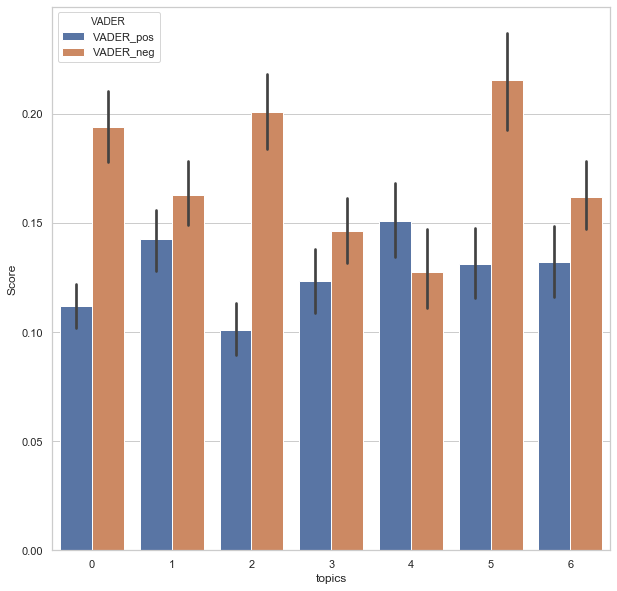

In [63]:
tweets_unique_melted_posneg = tweets_unique_melted[tweets_unique_melted["VADER"]!="VADER_neu"]

plt.figure(figsize = (10,10))
sns.set(style="whitegrid")

sns.barplot(x = 'topics',y = 'Score',hue = 'VADER',data = tweets_unique_melted_posneg)

# Observation: All topics tend to be negative.. 

### 4. Adding in of weights to determine the kind of relationship

a. if got RT, weight is given a value of 2. If it is a Mention, then weight is given a value of 1.

In [65]:
len(tweets_mw_df)

4885

In [66]:
tweets_mw_df.head(30)

,Text,User Account,Retweets,variable,Mentions
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo
5,Kinder Springenden Ball Children Baby Flash Ju...,stevenbold,NaN,0,NaN
6,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,0,smitabarooah
7,RT @EurekaMag: Interactive effects of polyamin...,Life_Sciences_,EurekaMag,0,EurekaMag
8,RT @EurekaMag: Interactive effects of polyamin...,Science_Alerts,EurekaMag,0,EurekaMag
9,Interactive effects of polyamines and arbuscul...,EurekaMag,NaN,0,NaN


In [67]:
tweets_mw_df_sent_topic = tweets_mw_df.merge(right = tweets_unique, left_on = 'Text', right_on = 'tweet', how = 'inner')
tweets_mw_df_sent_topic.drop('tweet', axis = 1, inplace = True)
tweets_mw_df_sent_topic

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye,0,The impact on all the schools is like a tsauna...,0.087,0.077,0.836,0
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye,0,The impact on all the schools is like a tsauna...,0.087,0.077,0.836,0
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN,1,The impact on all the schools is like a tsauna...,0.055,0.110,0.835,0
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY,2,Jgn stress bro. Take your time.,0.000,0.359,0.641,5
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo,3,Nobody at the pool so we got to horse around i...,0.312,0.000,0.688,0
...,...,...,...,...,...,...,...,...,...,...,...
4880,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,1,frhn,2552,I think this one is fairly measured lah - it’s...,0.000,0.167,0.833,6
4881,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,2,AudiKhalid,2552,I think this one is fairly measured lah - it’s...,0.000,0.167,0.833,6
4882,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,0,Maybelline,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,2
4883,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,1,Itcosmetics,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,2


In [68]:
tweets_mw_df_sent_topic[tweets_mw_df_sent_topic["User Account"]=='hindudilse']

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
6,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,0,smitabarooah,5,As it it stress levels high hain. Kyon manhoos...,0.0,0.203,0.797,3
8,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,1,RMantri,5,As it it stress levels high hain. Kyon manhoos...,0.0,0.203,0.797,3


In [69]:
tweets_mw_df[tweets_mw_df["User Account"]=="hindudilse"]

,Text,User Account,Retweets,variable,Mentions
6,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,0,smitabarooah
4058,RT @smitabarooah: @RMantri As it it stress lev...,hindudilse,smitabarooah,1,RMantri


In [70]:
outcome = tweets_mw_df.copy()

In [71]:
outcome_clean = outcome.drop('variable', axis = 1)
outcome_clean


,Text,User Account,Retweets,Mentions
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,LividEye
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,LividEye
2,The impact on all the schools is like a tsauna...,LividEye,NaN,NaN
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,PrinceMeedONLY
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,jmeteo
...,...,...,...,...
4880,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Thagraysentinel
4881,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Enigmaticatious
4882,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,rmbctious
4883,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,__Helicon__


In [72]:
outcome_clean[outcome_clean["Retweets"].isna()]

,Text,User Account,Retweets,Mentions
2,The impact on all the schools is like a tsauna...,LividEye,NaN,NaN
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,PrinceMeedONLY
5,Kinder Springenden Ball Children Baby Flash Ju...,stevenbold,NaN,NaN
9,Interactive effects of polyamines and arbuscul...,EurekaMag,NaN,NaN
10,"Stress can drag your whole team down, especial...",LewisGarrad,NaN,voiceongrowth
...,...,...,...,...
4880,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Thagraysentinel
4881,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Enigmaticatious
4882,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,rmbctious
4883,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,__Helicon__


In [73]:
outcome_clean['weight'] = ''

for row in range(0,len(outcome_clean)):
    outcome_clean.iloc[row, -1] = 2 - sum(outcome_clean.iloc[row,2:4].isna())


In [74]:
outcome_clean

,Text,User Account,Retweets,Mentions,weight
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,LividEye,2
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,LividEye,2
2,The impact on all the schools is like a tsauna...,LividEye,NaN,NaN,0
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,PrinceMeedONLY,1
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,jmeteo,2
...,...,...,...,...,...
4880,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Thagraysentinel,1
4881,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,Enigmaticatious,1
4882,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,rmbctious,1
4883,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,__Helicon__,1


### 5. Network Analysis

In [75]:
import networkx as nx

In [76]:
# Node Creation
node_creation1 = outcome_clean["User Account"].drop_duplicates(keep = 'first')
node_creation2 = outcome_clean["Mentions"].drop_duplicates(keep = 'first')

node_creation_list = [node_creation1, node_creation2]
node_creation = pd.concat(node_creation_list)

# Observation: This is no longer relevant anymore because you can create a network based on the "add_from_edges" method

In [77]:
# using the above variable 'outcome_clean', we'll generate a list for the creation.

outcome_clean_edge_creation = outcome_clean.loc[:,["User Account","Mentions","weight"]]
outcome_clean_edge_creation_groupby = outcome_clean_edge_creation.groupby(["User Account","Mentions"]).sum()

outcome_clean_edge_creation_groupby.reset_index(inplace = True)


edge_creation = []

for row in range(0,len(outcome_clean_edge_creation_groupby)):
    edge_creation.append([outcome_clean_edge_creation_groupby.iloc[row,0], outcome_clean_edge_creation_groupby.iloc[row,1], {"weight":outcome_clean_edge_creation_groupby.iloc[row,2]}])

edge_creation

[['02a9f413a5e3409', 'RiThViK_17', {'weight': 2}],
 ['02a9f413a5e3409', 'Sruti55713878', {'weight': 2}],
 ['02a9f413a5e3409', 'ivibhatweedy', {'weight': 2}],
 ['0athmeal', 'estherabigaaail', {'weight': 1}],
 ['0lhigen', 'NabaNaseer', {'weight': 2}],
 ['10minus6cosm', 'EngEongOoi', {'weight': 2}],
 ['18armyluv', 'bugkkura', {'weight': 2}],
 ['1lleg1irl', 'ErinBrownWrites', {'weight': 2}],
 ['1zombywoof', 'aaxxcdd', {'weight': 2}],
 ['24x7Page', '24x7Page', {'weight': 2}],
 ['28_HarshaSingh', 'MorningContext', {'weight': 2}],
 ['2covet', 'JoTyndallNZ', {'weight': 2}],
 ['30sakthi45', 'NathiyaFaith', {'weight': 2}],
 ['349262_', 'RUSYAIDI_RASHID', {'weight': 2}],
 ['3_stigma', 'tinyjiyang', {'weight': 2}],
 ['44FFFF2', 'awarenews', {'weight': 2}],
 ['44PatihJantung', 'valix217', {'weight': 1}],
 ['483caaec21b44b2', 'smitabarooah', {'weight': 2}],
 ['4tot_', 'faatinxo', {'weight': 2}],
 ['61taeng', 'itsakyo', {'weight': 2}],
 ['6uttercuppp', 'Jaarfuckingvis', {'weight': 2}],
 ['726Yasid', 

In [78]:
# Creating of network Diagram

G = nx.DiGraph()
G.add_edges_from(edge_creation)
eigen_values = nx.eigenvector_centrality(G)
nx.set_node_attributes(G,eigen_values, "eigenValues")

indegree_values = nx.in_degree_centrality(G)
nx.set_node_attributes(G, indegree_values, "indegreeValues")

degree_values = dict([x for x in G.degree()])
nx.set_node_attributes(G, degree_values, "degreeValues")

/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


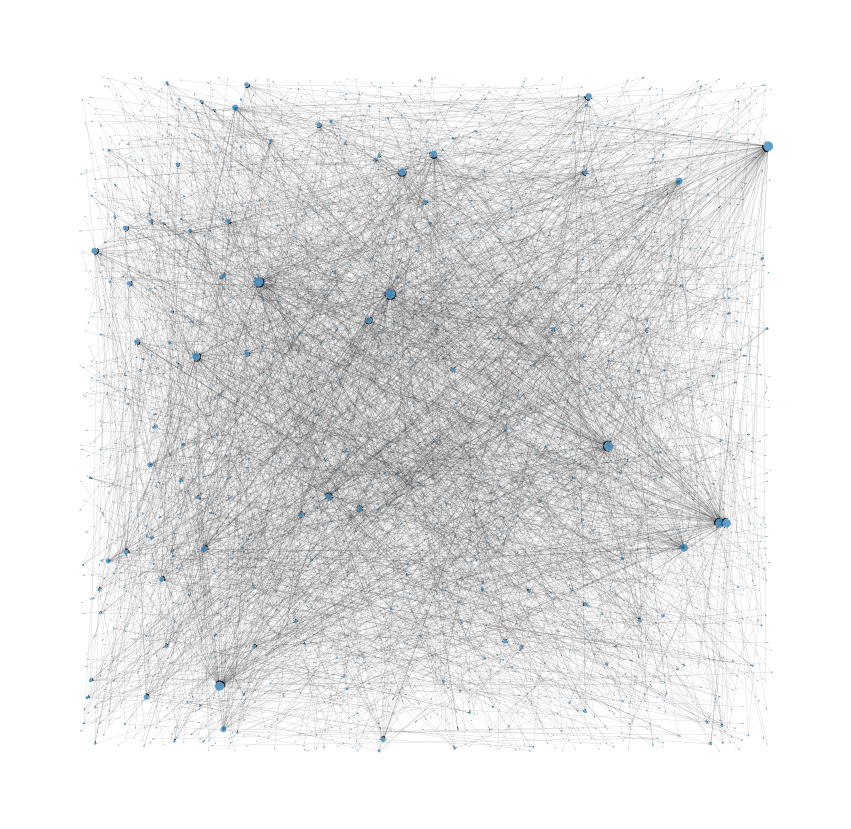

In [79]:
# Generating a Network Diagram of the tweets from our findings

# Create random layout positions
pos = nx.random_layout(G)

# Figure Size
plt.figure(figsize = (15,15))

# Create size list
sizes = [x[1] for x in G.degree()]

# Draw the network
nx.draw_networkx(G, pos, 
    with_labels = False, 
    node_size = sizes,
    width = 0.1, alpha = 0.7,
    arrowsize = 2, linewidths = 0)

# Turn axis off and show
plt.axis('off'); plt.show()

In [41]:
centrality = nx.in_degree_centrality(G)
column_names = ['screen_name', 'degree_centrality']

# Store centralities in DataFrame
rt = pd.DataFrame(list(centrality.items()), columns = column_names)

# Print first five results in descending order of centrality
print(rt.sort_values('degree_centrality', ascending = False).head())


      screen_name  degree_centrality
107  MustaqimJiwa           0.026243
94     mizi_wahid           0.024586
32   smitabarooah           0.022928
92       _ayakojh           0.022099
36        itsakyo           0.021823


In [42]:
centrality = nx.betweenness_centrality(G)
column_names = ['screen_name', 'betweenness_centrality']

# Store centralities in DataFrame
rt = pd.DataFrame(list(centrality.items()), columns = column_names)

# Print first five results in descending order of centrality
print(rt.sort_values('betweenness_centrality', ascending = False).head())

         screen_name  betweenness_centrality
51          AChVoice                0.000023
400      Daraljoshua                0.000016
197      Defence_360                0.000011
99            bxbxg_                0.000010
81   SoftPowerCenter                0.000010


In [80]:
from networkx.algorithms import community

comp = community.girvan_newman(G)
communities_list = list(sorted(c) for c in next(comp))

In [81]:
# deriving the communities with a size of at least 20

k = 20
top_communities = []

for i in range(0,len(communities_list)):
    if len(communities_list[i]) >= k:
        top_communities.append(communities_list[i])

        

In [82]:
len(top_communities)

24

In [83]:
# Creating a dictionary to add community ID's to network, G

top_communities_nodes_communityID = {}
i = 0

for community in top_communities:
    for node in community:
        top_communities_nodes_communityID.update({node : i})
    i += 1
    
top_communities_nodes_communityID

{'0lhigen': 0,
 'AmnaAliShareef': 0,
 'Applecinnamonmv': 0,
 'Auralitica': 0,
 'FathimathHusha': 0,
 'Ishan_Inz': 0,
 'MaaniAnwar': 0,
 'Marcus15510974': 0,
 'MarinaFaiz': 0,
 'NabaNaseer': 0,
 'Nafee77': 0,
 'NashimMirash': 0,
 'NihaNaseer': 0,
 'Omulungi_Hawt': 0,
 'SamiyyaAR': 0,
 'SaraShafeyu': 0,
 '_CYchology': 0,
 '_maail10': 0,
 'alilayaal': 0,
 'amynaa': 0,
 'angelaalegre_': 0,
 'benchy007': 0,
 'haaboli': 0,
 'hamnahaqansari': 0,
 'hathareskan': 0,
 'hayashiham': 0,
 'ipha_ahmed': 0,
 'ish_aa': 0,
 'izznzz': 0,
 'jeeehan': 0,
 'kofeemeta': 0,
 'maseeh_n5m': 0,
 'mifkko': 0,
 'mindtrip88': 0,
 'muhammed_uday': 0,
 'nafhha': 0,
 'naphbutt': 0,
 'nayyyifa': 0,
 'neiymeeheh': 0,
 'reemadamibrahim': 0,
 'rfdhbrhm': 0,
 'rikachs': 0,
 'shafmed': 0,
 'sharasekaram': 0,
 'shininay131825': 0,
 'sumudhuj': 0,
 'yajatdua': 0,
 'zarascomics': 0,
 '18armyluv': 1,
 '61taeng': 1,
 'AtikasariFina': 1,
 'CevarAlexander': 1,
 'Dlrshnnon': 1,
 'Dragnee68123115': 1,
 'IndayFaith02': 1,
 'IzabelGr

In [47]:
# Adding to network, G, our community IDs of those identified to be in communities of size 20 and above

nx.set_node_attributes(G,top_communities_nodes_communityID, "communityID")


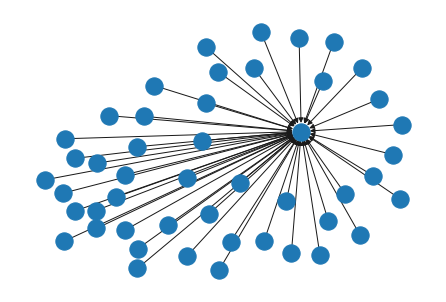

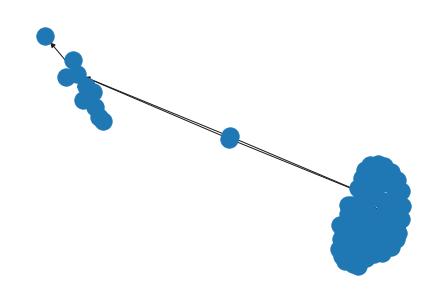

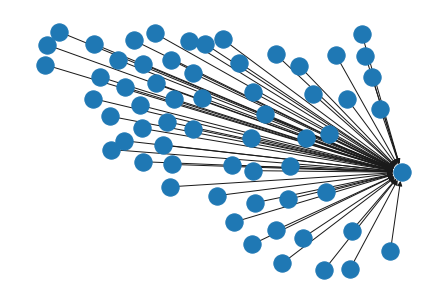

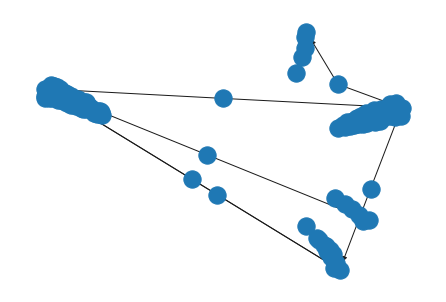

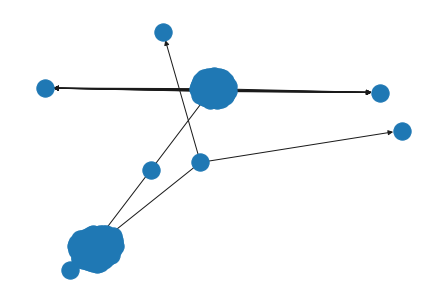

...

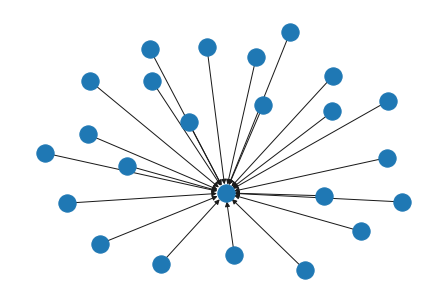

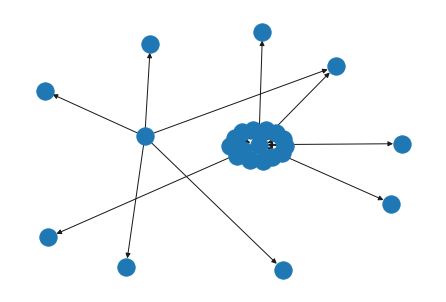

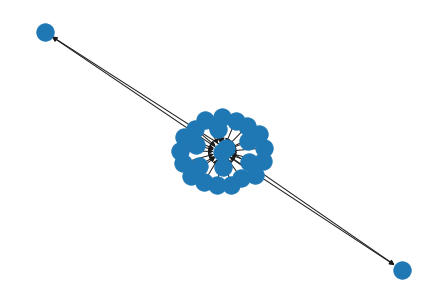

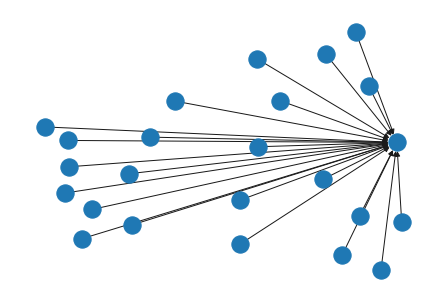

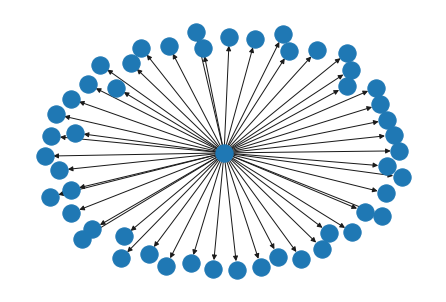

In [48]:
for i in range(0,len(top_communities)):
    G_sg = G.subgraph(top_communities[i])
    nx.draw(G_sg)
    plt.show()

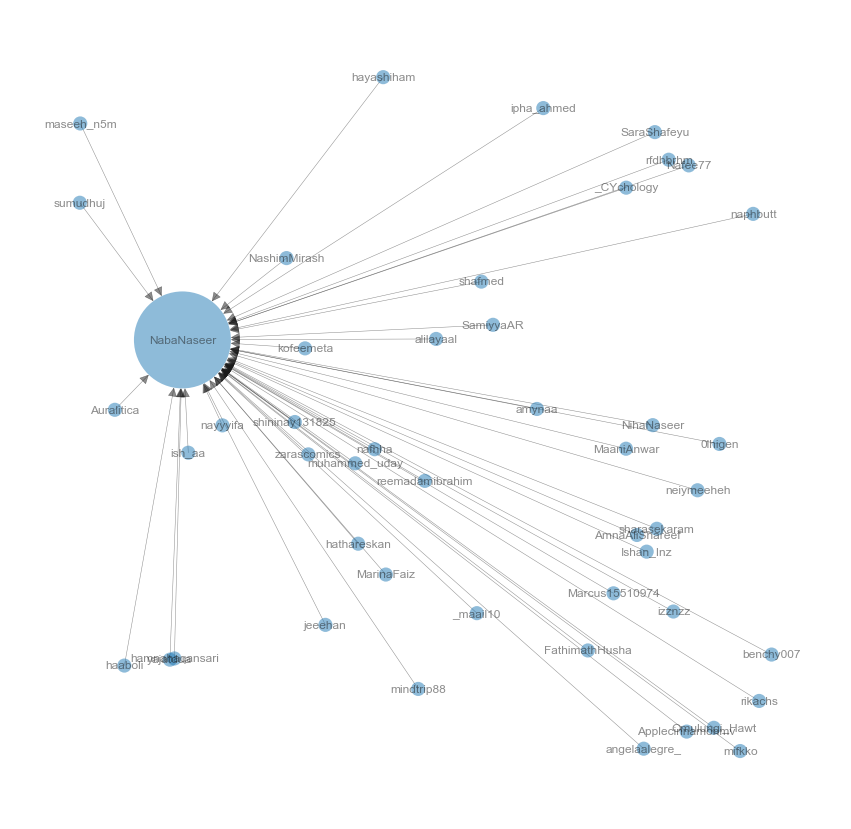

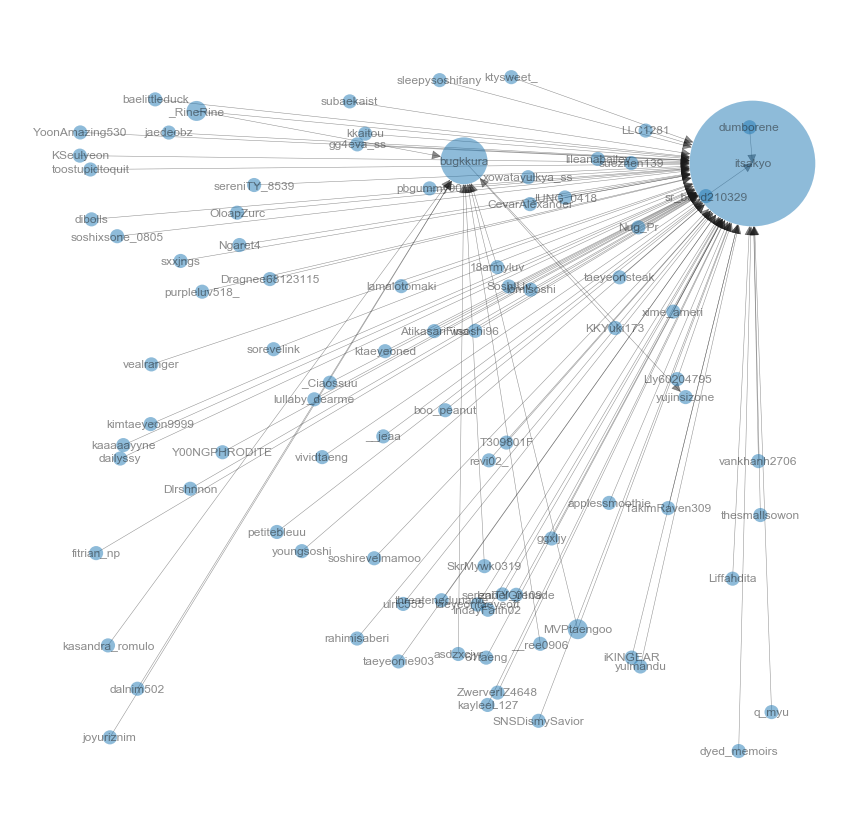

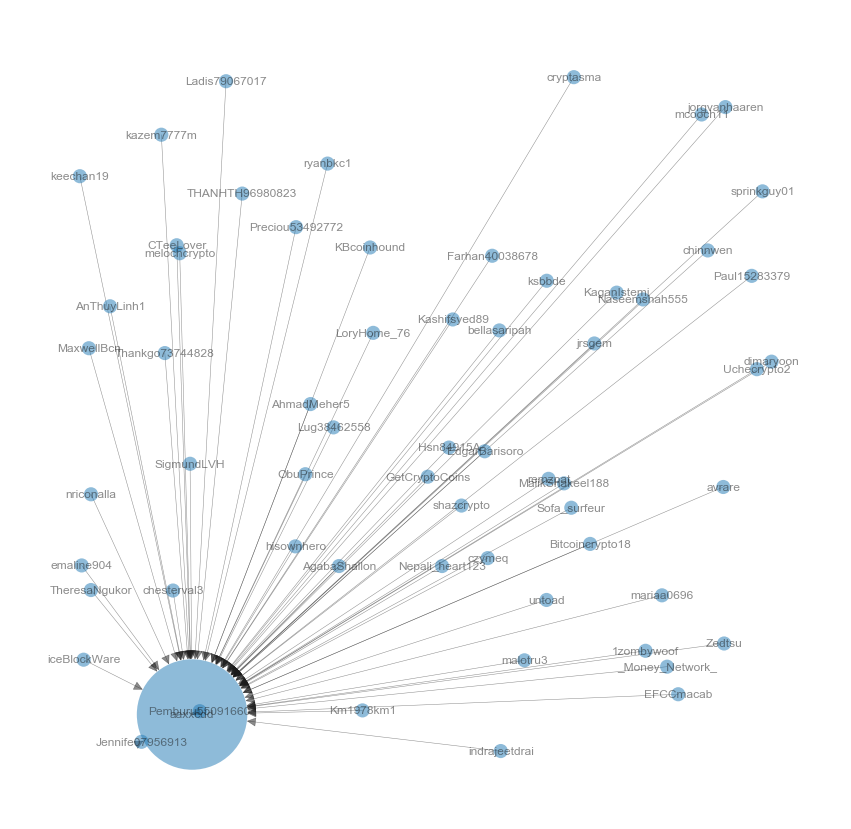

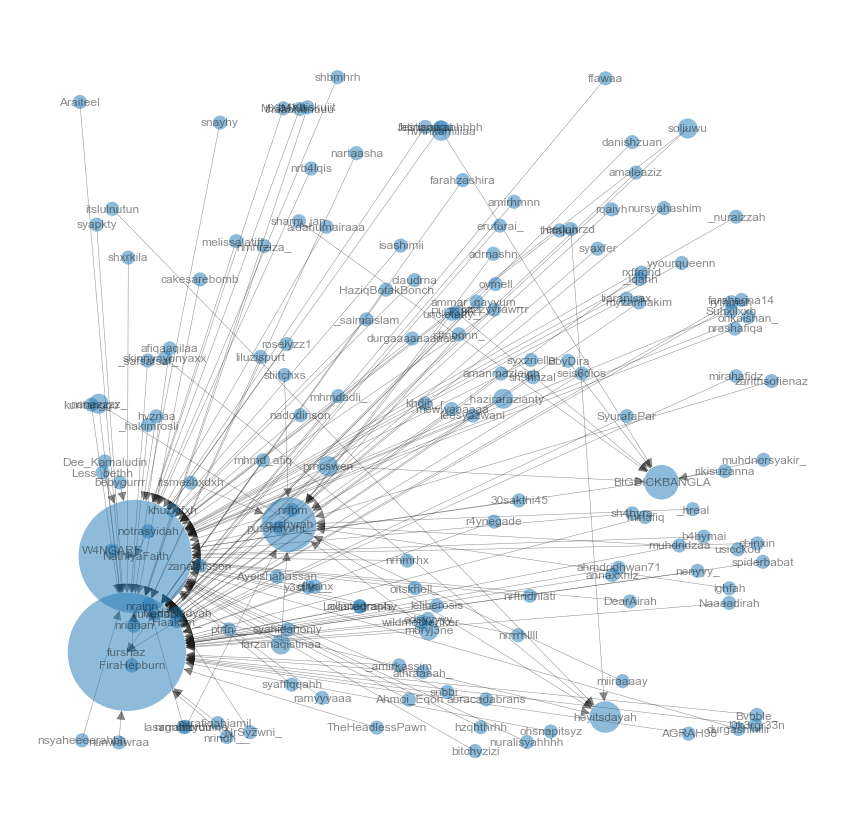

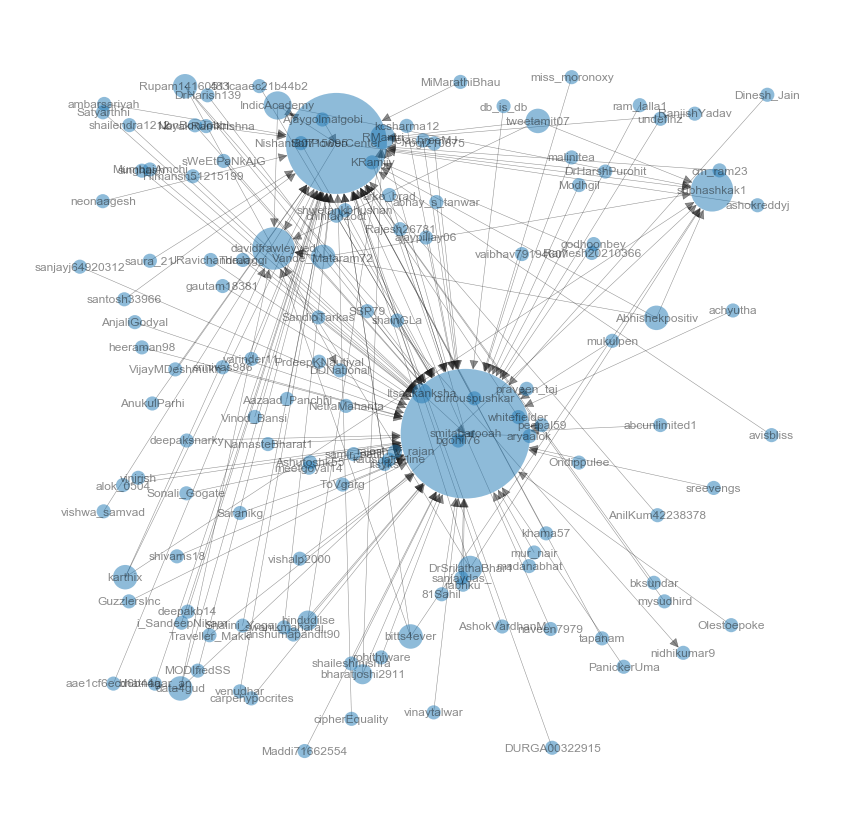

...

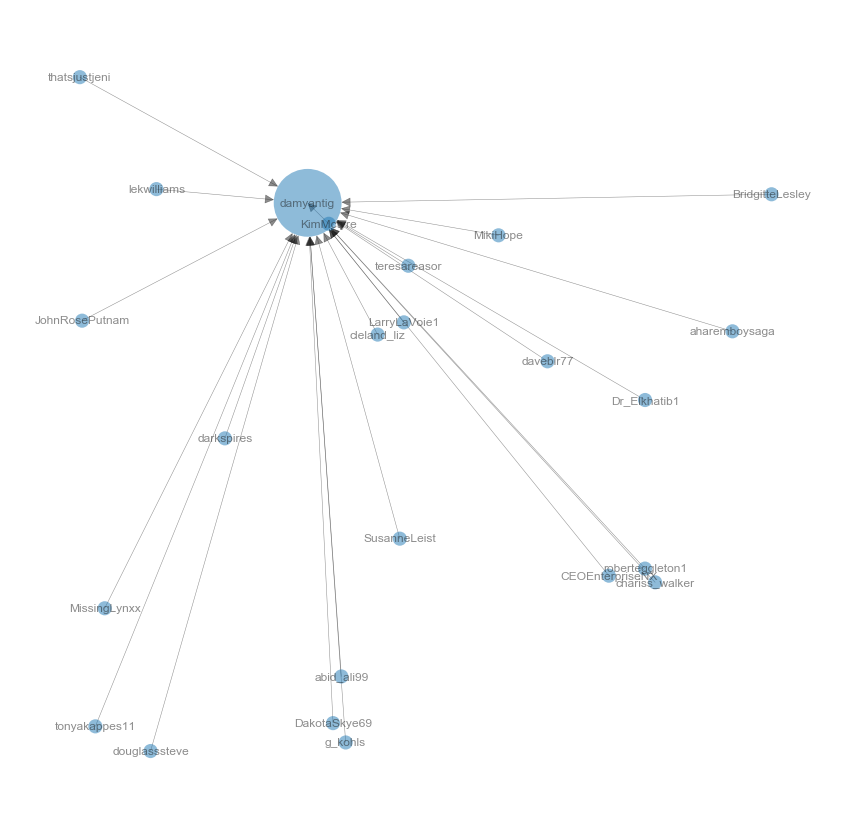

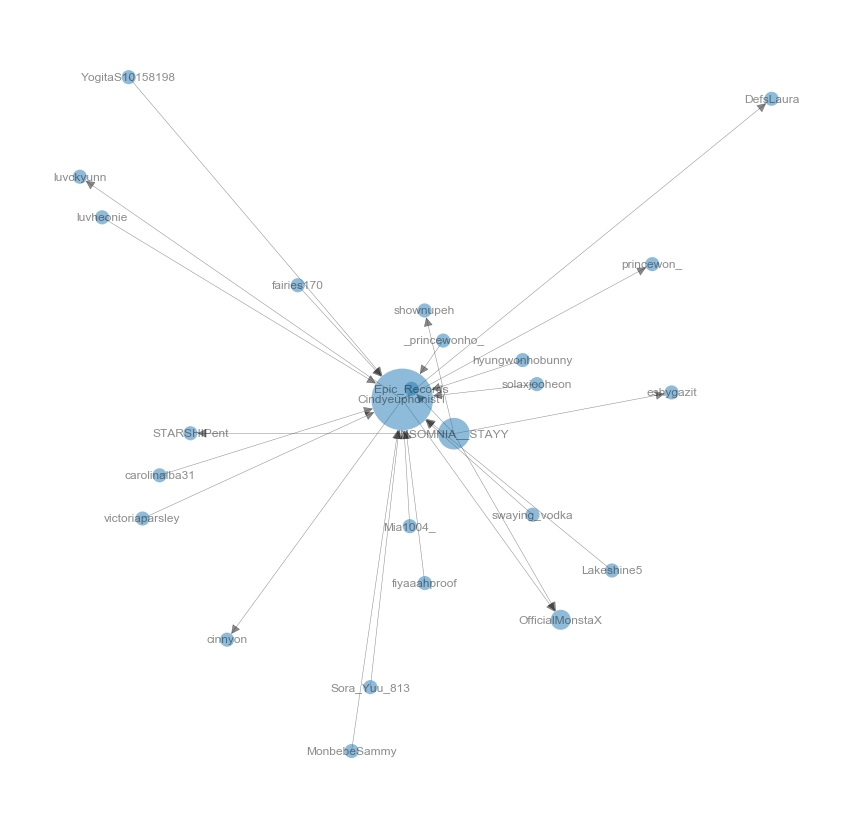

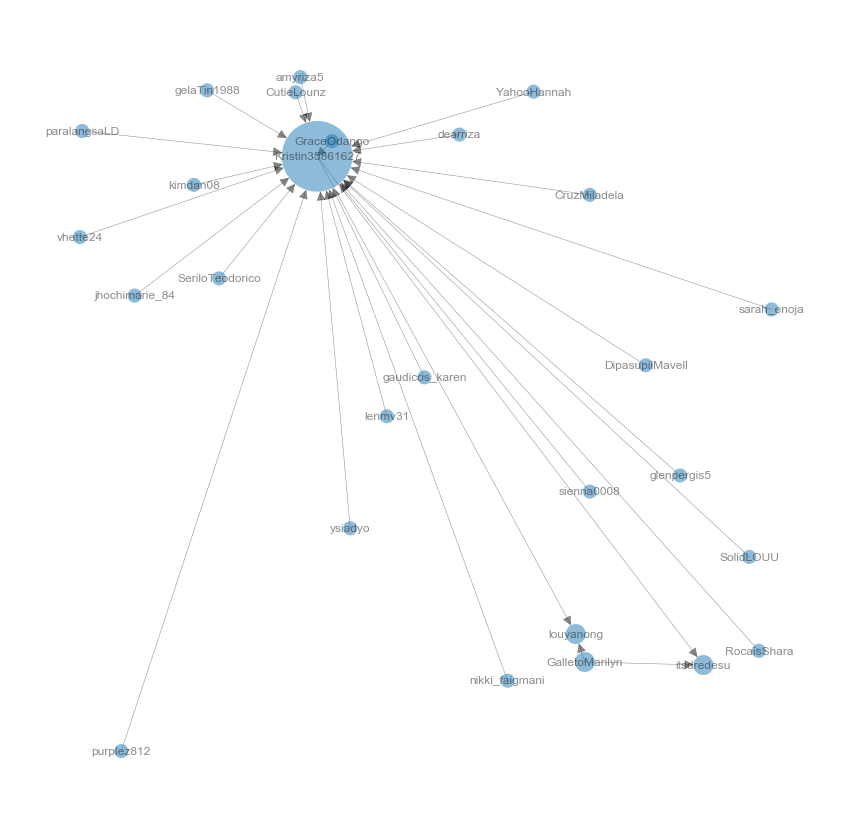

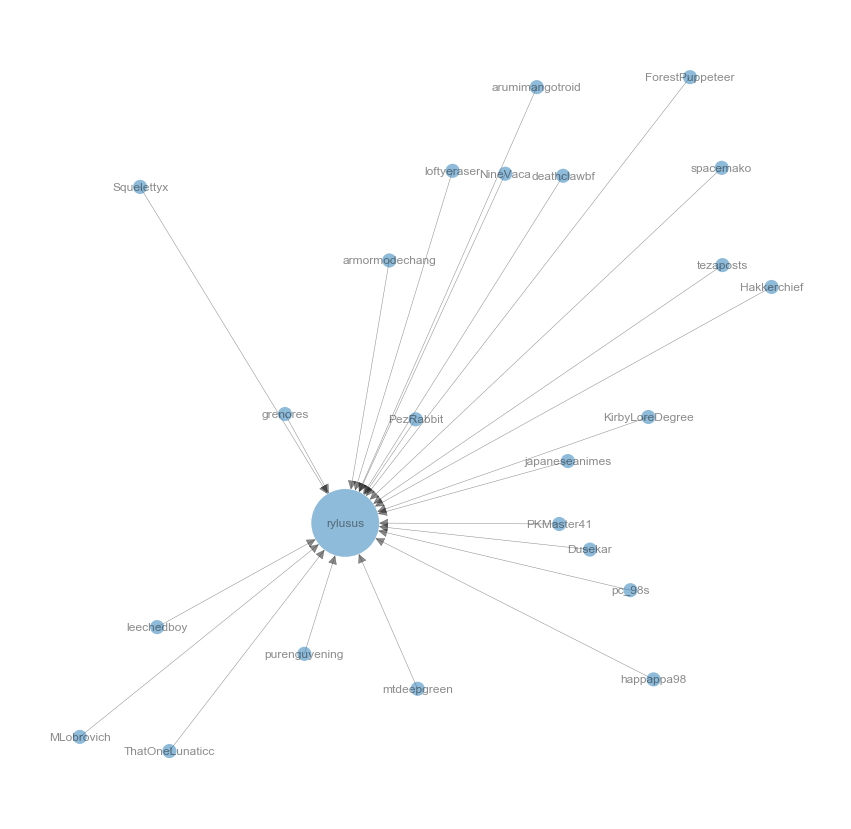

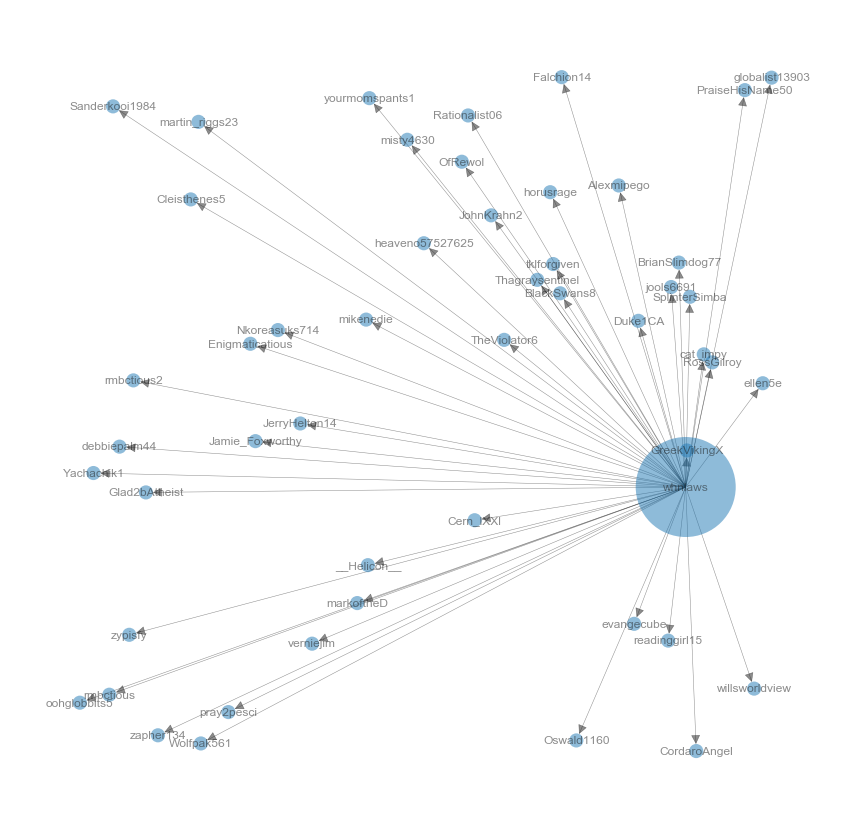

In [48]:
for i in range(0,len(top_communities)):
    G_sg = G.subgraph(top_communities[i])
    
    # Create random layout positions
    pos = nx.random_layout(G_sg)

    # Figure Size
    plt.figure(figsize = (15,15))

    # Create size list
    sizes = [(v['degreeValues'] * 200) for (u, v) in G_sg.nodes(data=True)]
    # sizes = [x[1]*20 for x in G_sg.degree()]

    # Draw the network
    nx.draw_networkx(G_sg, pos, 
        with_labels = True, 
        node_size = sizes,
        width = 0.5, alpha = 0.5,
        arrowsize = 20, linewidths = 0)
    
    # Draw the axis based on their weights
    

    # Turn axis off and show
    plt.axis('off'); plt.show()

### Pulling out the communities

In [84]:
tweets_mw_df_sent_topic

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye,0,The impact on all the schools is like a tsauna...,0.087,0.077,0.836,0
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye,0,The impact on all the schools is like a tsauna...,0.087,0.077,0.836,0
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN,1,The impact on all the schools is like a tsauna...,0.055,0.110,0.835,0
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY,2,Jgn stress bro. Take your time.,0.000,0.359,0.641,5
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo,3,Nobody at the pool so we got to horse around i...,0.312,0.000,0.688,0
...,...,...,...,...,...,...,...,...,...,...,...
4880,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,1,frhn,2552,I think this one is fairly measured lah - it’s...,0.000,0.167,0.833,6
4881,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,2,AudiKhalid,2552,I think this one is fairly measured lah - it’s...,0.000,0.167,0.833,6
4882,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,0,Maybelline,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,2
4883,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,1,Itcosmetics,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,2


In [85]:
len(top_communities_nodes_communityID)

1548

In [86]:
top_communities_nodes_communityID_df = pd.DataFrame(top_communities_nodes_communityID.items(), columns = ['User Account','CommunityID'])

In [87]:
top_communities_nodes_communityID_df

,User Account,CommunityID
0,0lhigen,0
1,AmnaAliShareef,0
2,Applecinnamonmv,0
3,Auralitica,0
4,FathimathHusha,0
...,...,...
1543,whnlaws,23
1544,willsworldview,23
1545,yourmomspants1,23
1546,zapher134,23


In [88]:
tweets_mw_df_sent_topic[tweets_mw_df_sent_topic['Mentions'] == 'zypisfy']

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics
4743,@willsworldview @JohnKrahn2 @BrianSlimdog77 @B...,whnlaws,NaN,20,zypisfy,2534,please get stuck into this thread. Why should ...,0.087,0.196,0.717,2


In [89]:
tweets_mw_df_sent_topic_communityID = tweets_mw_df_sent_topic.merge(right = top_communities_nodes_communityID_df, left_on = 'User Account', right_on = 'User Account', how = 'left')
tweets_mw_df_sent_topic_communityID

,Text,User Account,Retweets,variable,Mentions,index,noURLnoMention,VADER_pos,VADER_neg,VADER_neu,topics,CommunityID
0,RT @LividEye: The impact on all the schools is...,tanhuiyi,LividEye,0,LividEye,0,The impact on all the schools is like a tsauna...,0.087,0.077,0.836,0,18.0
1,RT @LividEye: The impact on all the schools is...,virginangelic,LividEye,0,LividEye,0,The impact on all the schools is like a tsauna...,0.087,0.077,0.836,0,18.0
2,The impact on all the schools is like a tsauna...,LividEye,NaN,0,NaN,1,The impact on all the schools is like a tsauna...,0.055,0.110,0.835,0,18.0
3,@PrinceMeedONLY Jgn stress bro. Take your time.,SwagOnDroid,NaN,0,PrinceMeedONLY,2,Jgn stress bro. Take your time.,0.000,0.359,0.641,5,NaN
4,RT @jmeteo: Nobody at the pool so we got to ho...,tayloryong41,jmeteo,0,jmeteo,3,Nobody at the pool so we got to horse around i...,0.312,0.000,0.688,0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4880,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,1,frhn,2552,I think this one is fairly measured lah - it’s...,0.000,0.167,0.833,6,18.0
4881,@historyogi @frhn @AudiKhalid I think this one...,tash_aam,NaN,2,AudiKhalid,2552,I think this one is fairly measured lah - it’s...,0.000,0.167,0.833,6,18.0
4882,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,0,Maybelline,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,2,NaN
4883,So I finally bought the @Maybelline Fit Me fou...,ANILxA,NaN,1,Itcosmetics,2553,So I finally bought the Fit Me foundation ser...,0.218,0.103,0.679,2,NaN


In [90]:
tweets_mw_df_sent_topic_communityID['CommunityID'].value_counts()

17.0    213
5.0     176
3.0     166
6.0     164
4.0     161
11.0    100
1.0      91
9.0      89
18.0     87
8.0      81
16.0     64
2.0      61
23.0     50
0.0      49
7.0      46
12.0     34
13.0     33
21.0     30
20.0     29
15.0     27
19.0     23
14.0     23
22.0     23
10.0     20
Name: CommunityID, dtype: int64

In [74]:
top_communities

[['0lhigen',
  'AmnaAliShareef',
  'Applecinnamonmv',
  'Auralitica',
  'FathimathHusha',
  'Ishan_Inz',
  'MaaniAnwar',
  'Marcus15510974',
  'MarinaFaiz',
  'NabaNaseer',
  'Nafee77',
  'NashimMirash',
  'NihaNaseer',
  'Omulungi_Hawt',
  'SamiyyaAR',
  'SaraShafeyu',
  '_CYchology',
  '_maail10',
  'alilayaal',
  'amynaa',
  'angelaalegre_',
  'benchy007',
  'haaboli',
  'hamnahaqansari',
  'hathareskan',
  'hayashiham',
  'ipha_ahmed',
  'ish_aa',
  'izznzz',
  'jeeehan',
  'kofeemeta',
  'maseeh_n5m',
  'mifkko',
  'mindtrip88',
  'muhammed_uday',
  'nafhha',
  'naphbutt',
  'nayyyifa',
  'neiymeeheh',
  'reemadamibrahim',
  'rfdhbrhm',
  'rikachs',
  'shafmed',
  'sharasekaram',
  'shininay131825',
  'sumudhuj',
  'yajatdua',
  'zarascomics'],
 ['18armyluv',
  '61taeng',
  'AtikasariFina',
  'CevarAlexander',
  'Dlrshnnon',
  'Dragnee68123115',
  'IndayFaith02',
  'IzabelGrenade',
  'JUNG_0418',
  'KKYuki173',
  'KSeulyeon',
  'LLC1281',
  'Liffahdita',
  'Lly60204795',
  'MVPtae

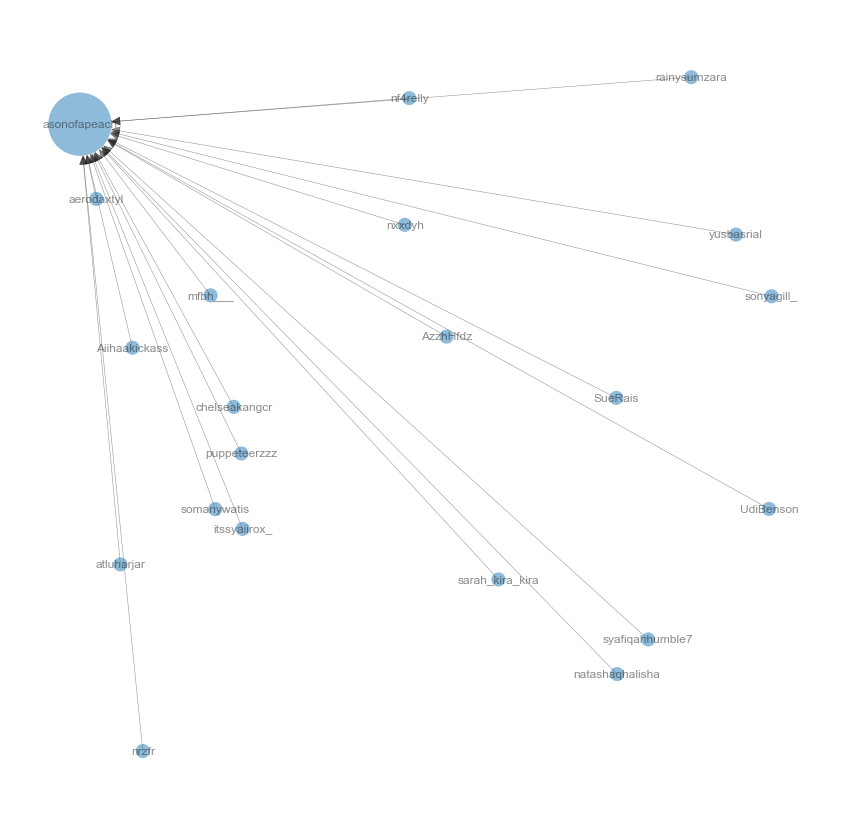

In [75]:
G_sg = G.subgraph(top_communities[10])
    
# Create random layout positions
pos = nx.random_layout(G_sg)

# Figure Size
plt.figure(figsize = (15,15))

# Create size list
sizes = [(v['degreeValues'] * 200) for (u, v) in G_sg.nodes(data=True)]
# sizes = [x[1]*20 for x in G_sg.degree()]

# Draw the network
nx.draw_networkx(G_sg, pos, 
    with_labels = True, 
    node_size = sizes,
    width = 0.5, alpha = 0.5,
    arrowsize = 20, linewidths = 0)

# Draw the axis based on their weights


# Turn axis off and show
plt.axis('off'); plt.show()

In [59]:
test_groupby = tweets_mw_df_sent_topic_communityID.groupby(['CommunityID']).mean()

In [65]:
test_groupby.index

Float64Index([ 0.0,  1.0,  2.0,  3.0,  4.0,  5.0,  6.0,  7.0,  8.0,  9.0, 10.0,
              11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0,
              22.0, 23.0],
             dtype='float64', name='CommunityID')

In [96]:
test_groupby = tweets_mw_df_sent_topic_communityID.groupby(['CommunityID']).mean()

# pos_communities_list = list(test_groupby[test_groupby["VADER_pos"] > test_groupby["VADER_neg"]].index)
# pos_communities_list

all_communities_list = list(test_groupby.index)


In [97]:
to_remove = [2.0, 10.0,19.0, 22.0, 23.0]

for communityID in all_communities_list:
    if communityID in to_remove:
        all_communities_list.remove(communityID)

In [99]:
all_communities_list.remove(23.0)
all_communities_list

[0.0,
 1.0,
 3.0,
 4.0,
 5.0,
 6.0,
 7.0,
 8.0,
 9.0,
 11.0,
 12.0,
 13.0,
 14.0,
 15.0,
 16.0,
 17.0,
 18.0,
 20.0,
 21.0]

CommunityID:  0
0: 0.112*"find" + 0.112*"type" + 0.112*"t…" + 0.112*"lot" + 0.112*"ableist" + 0.112*"right" + 0.112*"exactly" + 0.112*"rhetoric" + 0.013*"take" + 0.013*"distract"
1: 0.147*"take" + 0.088*"mental" + 0.088*"health" + 0.088*"socialdistancing" + 0.088*"care" + 0.088*"break" + 0.088*"sure" + 0.088*"distract" + 0.030*"rhetoric" + 0.030*"exactly"


/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


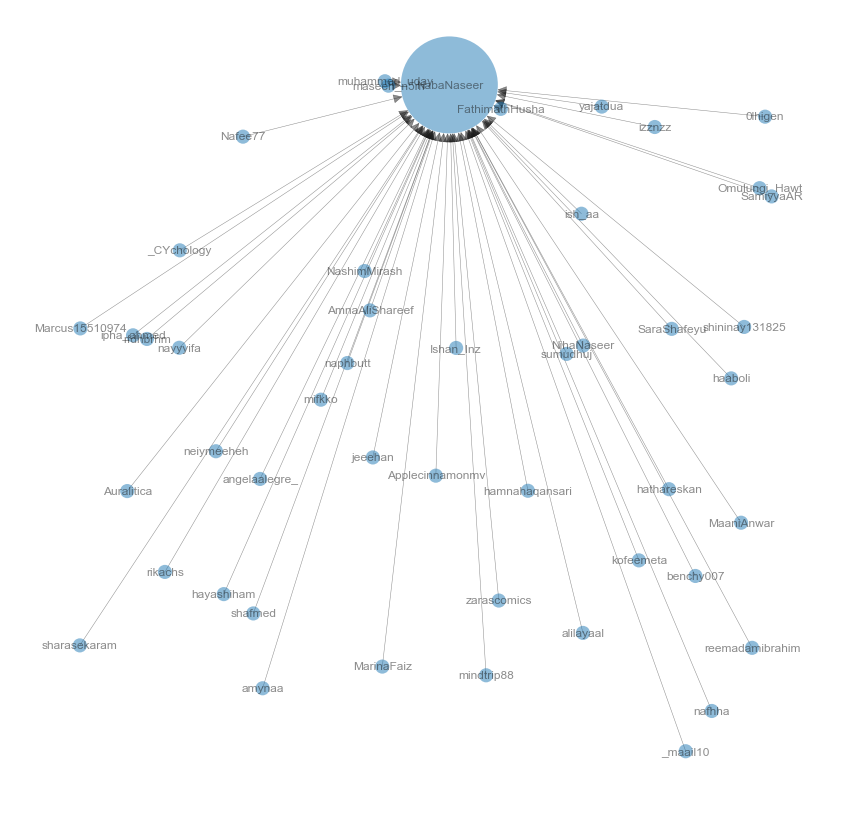

CommunityID:  1
0: 0.123*"fucking" + 0.113*"want" + 0.113*"happening" + 0.113*"dont" + 0.113*"life" + 0.103*"only…" + 0.015*"useless" + 0.015*"feel" + 0.015*"thing" + 0.015*"good"
1: 0.051*"ago" + 0.051*"taeyeon" + 0.051*"hence" + 0.051*"spin" + 0.051*"made" + 0.051*"fan" + 0.051*"tonight" + 0.051*"instead" + 0.051*"skill" + 0.051*"since"


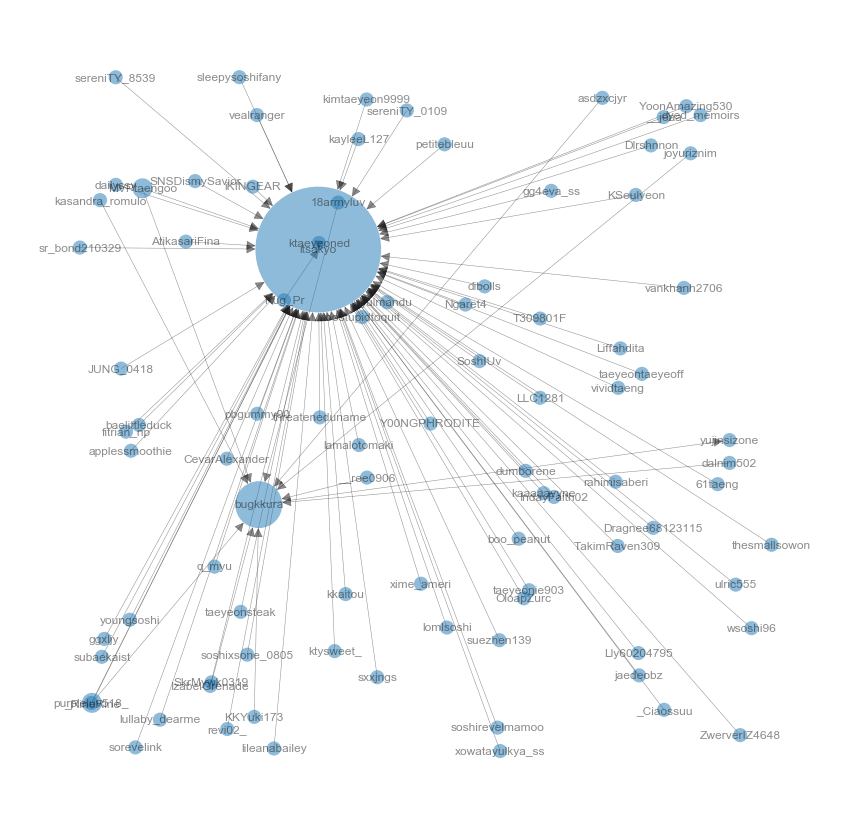

CommunityID:  3
0: 0.093*"look" + 0.093*"even" + 0.093*"u" + 0.093*"lol" + 0.093*"pretty" + 0.093*"struggle" + 0.032*"tired" + 0.031*"sick" + 0.022*"putting" + 0.022*"straight"
1: 0.055*"suka" + 0.055*"build" + 0.055*"senang" + 0.055*"islam" + 0.055*"wedding" + 0.055*"unne…" + 0.055*"stigma" + 0.055*"ikut" + 0.055*"part" + 0.055*"big"


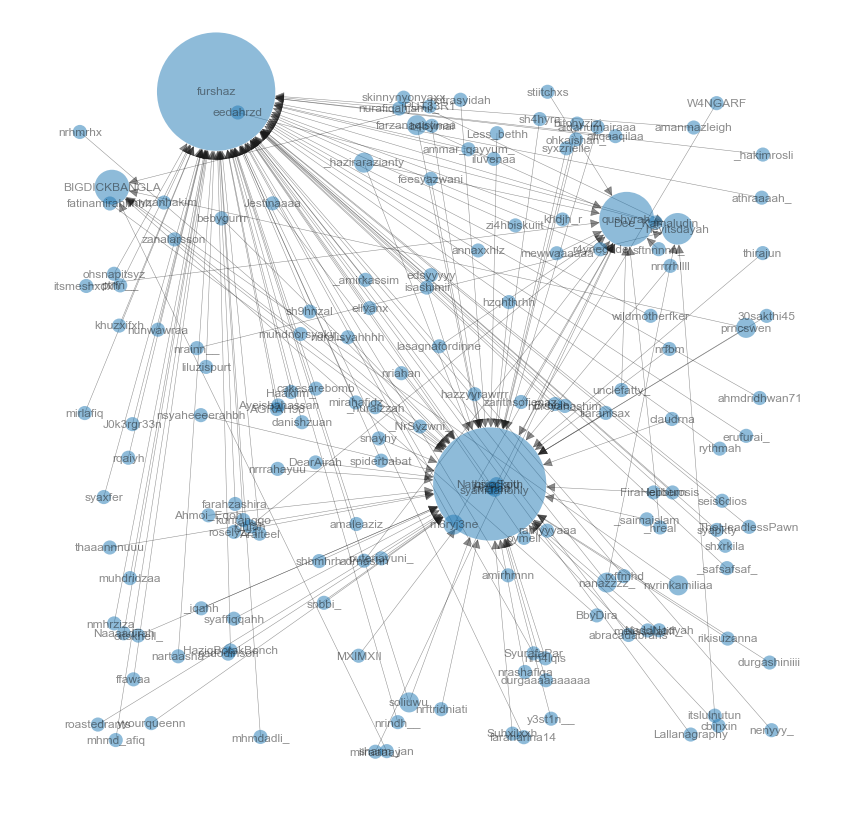

CommunityID:  4
0: 0.086*"government" + 0.086*"provide" + 0.086*"want" + 0.086*"mask" + 0.086*"taxpayer" + 0.086*"on…" + 0.086*"money" + 0.086*"sanitizers" + 0.086*"shaheenbagh" + 0.086*"spent"
1: 0.056*"fight" + 0.056*"india" + 0.043*"ancient" + 0.043*"medical" + 0.043*"harvard" + 0.043*"pranayama" + 0.043*"breath" + 0.043*"covid-…" + 0.043*"school" + 0.043*"blog"


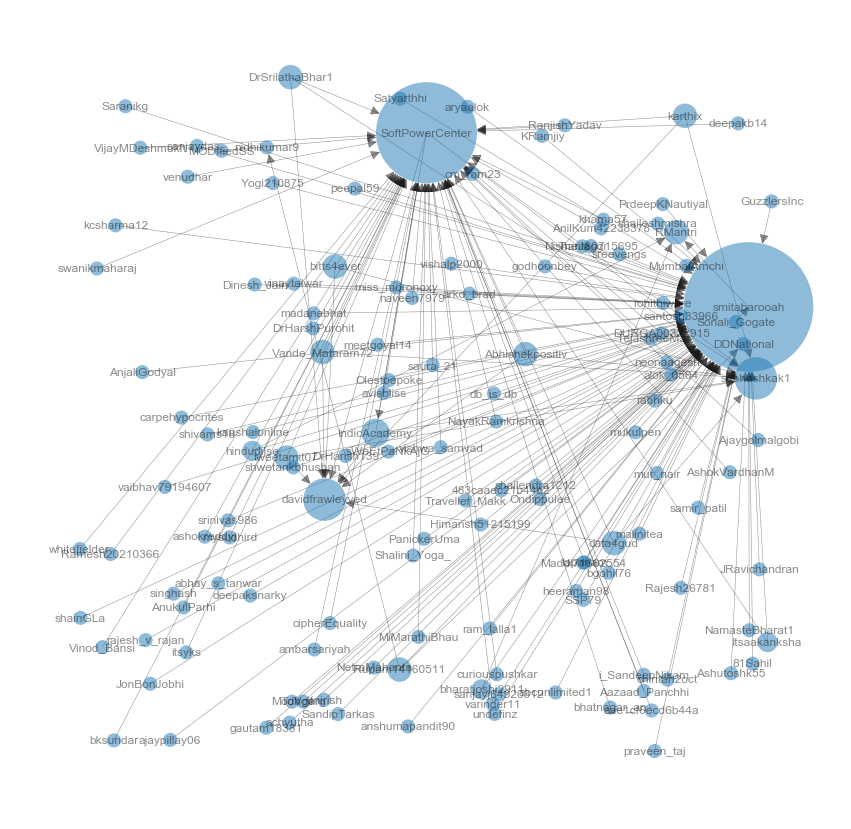

CommunityID:  5
0: 0.054*"anyone" + 0.037*"never" + 0.037*"true" + 0.037*"lie" + 0.037*"depressed" + 0.036*"fun" + 0.036*"bored" + 0.036*"till" + 0.031*"personal" + 0.031*"nobody"
1: 0.121*"love" + 0.066*"always" + 0.064*"keep" + 0.062*"wan" + 0.060*"mental" + 0.060*"ta" + 0.060*"illness" + 0.034*"lookout" + 0.033*"everything" + 0.033*"please"


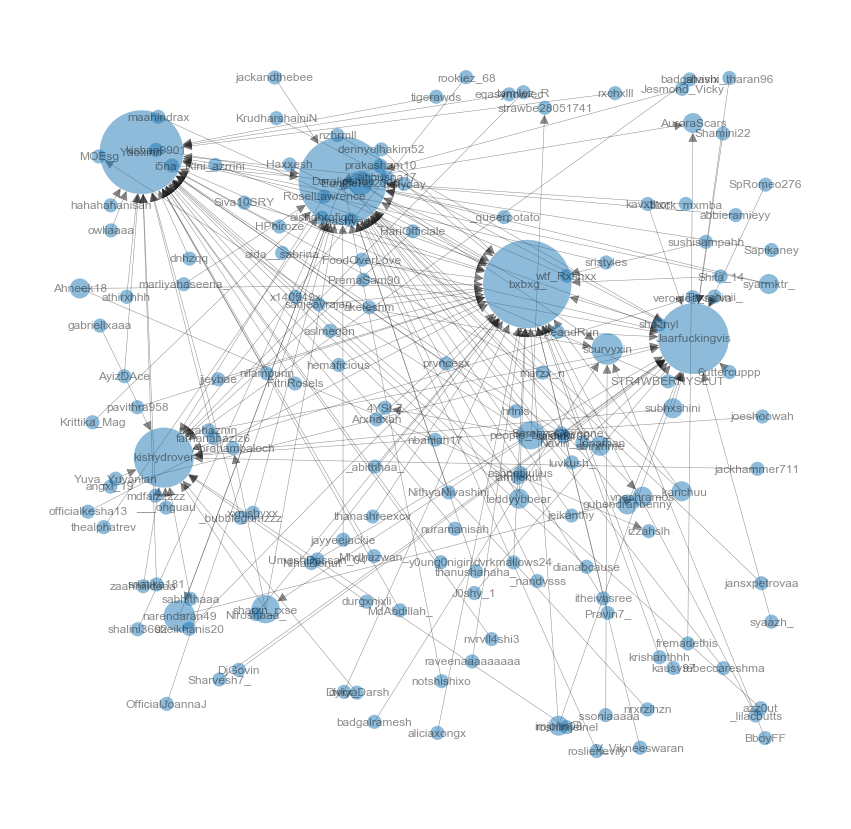

CommunityID:  6
0: 0.039*"school" + 0.035*"student" + 0.033*"bullying" + 0.033*"toh" + 0.033*"incident" + 0.033*"mee" + 0.031*"principal" + 0.029*"disciplined" + 0.029*"differentiates" + 0.029*"covid-19"
1: 0.047*"10" + 0.043*"coronavirus" + 0.033*"die" + 0.030*"uk" + 0.020*"year" + 0.019*"taunted" + 0.019*"schoolmate" + 0.019*"'ugly" + 0.019*"'fat" + 0.019*"—"


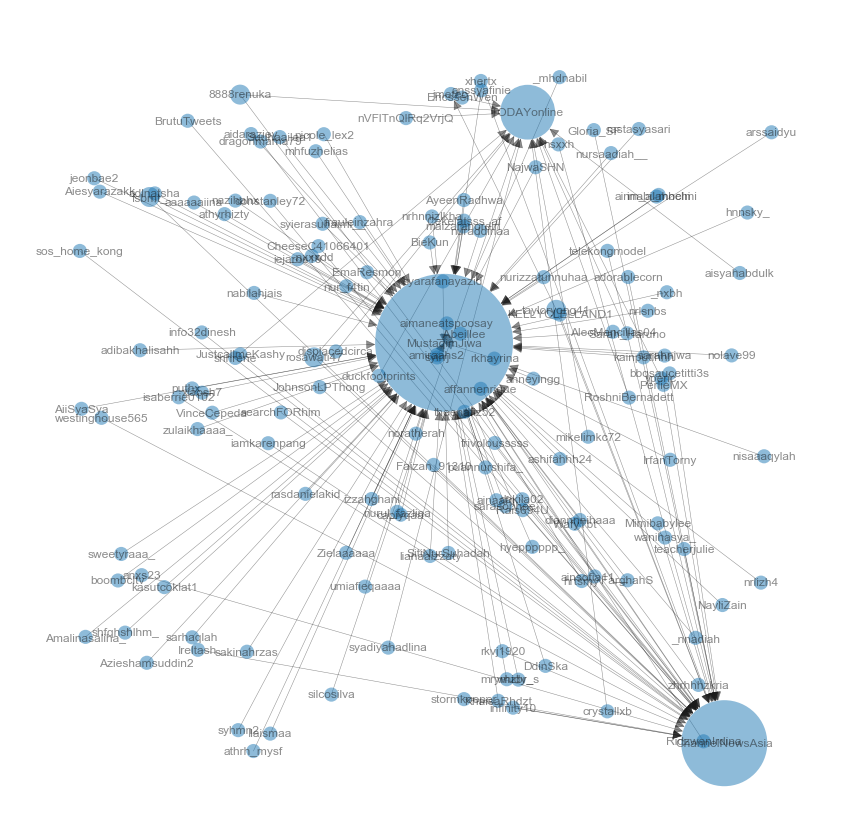

CommunityID:  7
0: 0.032*"maybe" + 0.032*"daily" + 0.026*"know" + 0.026*"body" + 0.026*"tired" + 0.026*"depressed" + 0.026*"sad" + 0.026*"fighting" + 0.026*"exhausted" + 0.017*"constantly"
1: 0.039*"and…" + 0.036*"selfcare" + 0.034*"picture" + 0.034*"le" + 0.034*"magazine" + 0.034*"energy" + 0.034*"becomes" + 0.034*"painted" + 0.034*"limited" + 0.034*"glamorous"


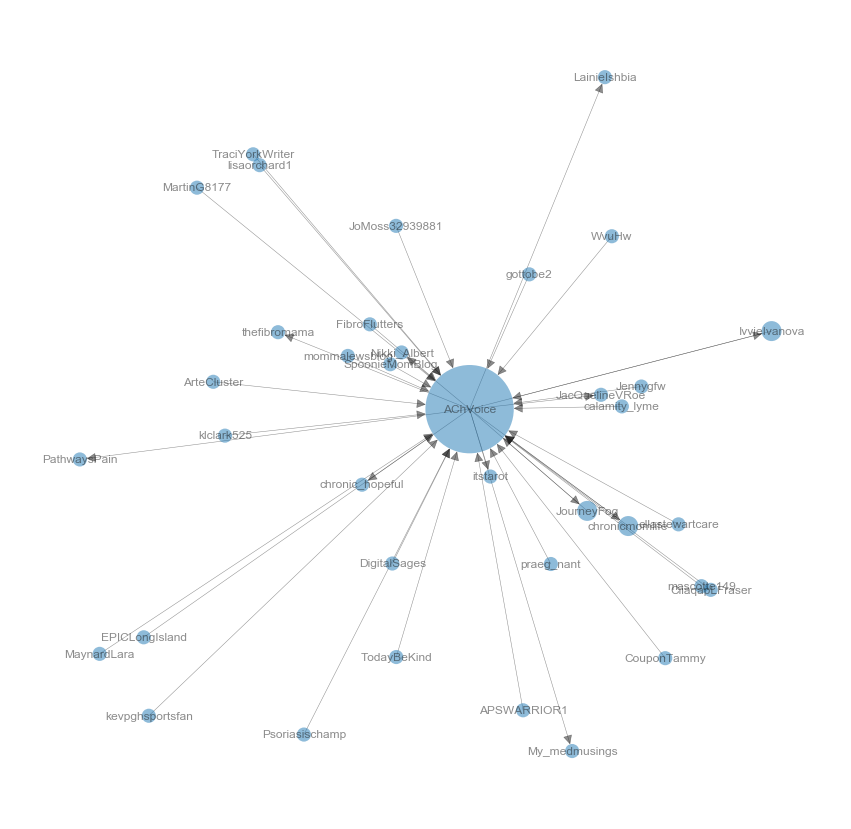

CommunityID:  8
0: 0.199*"new" + 0.199*"stanned" + 0.199*"yea" + 0.040*"ever" + 0.040*"never" + 0.040*"chart" + 0.040*"shak…" + 0.040*"today" + 0.040*"thought" + 0.040*"lisakko"
1: 0.104*"lisa" + 0.104*"dreamcatcher" + 0.104*"lisakko" + 0.104*"thought" + 0.104*"today" + 0.104*"chart" + 0.104*"never" + 0.104*"ever" + 0.075*"shak…" + 0.045*"shaking"


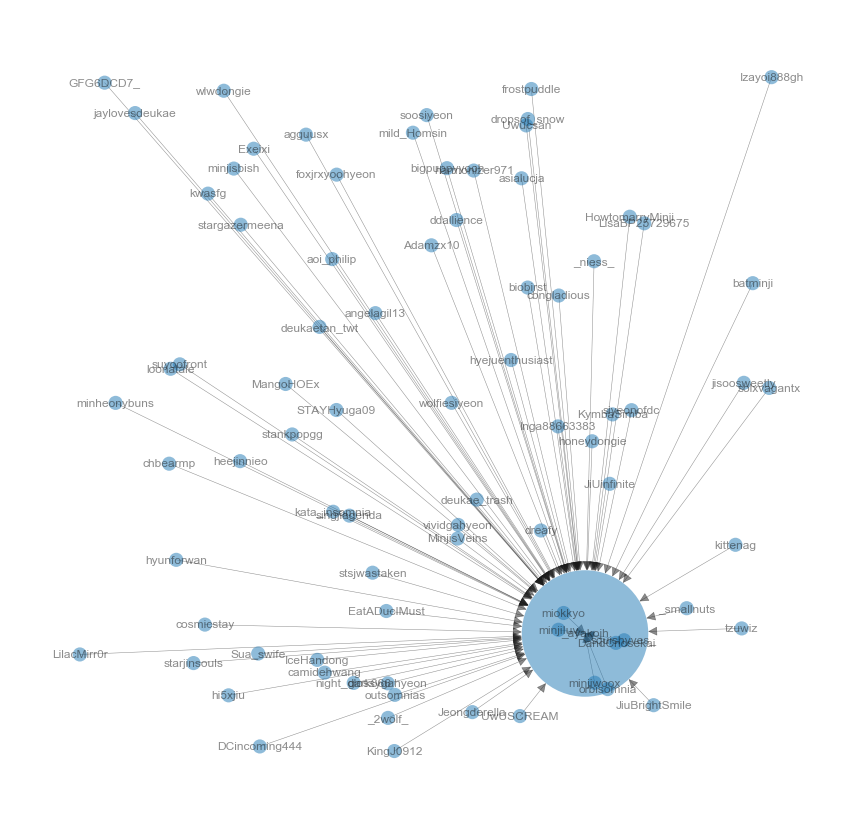

CommunityID:  9
0: 0.085*"many" + 0.085*"stressed" + 0.085*"stress" + 0.085*"forward" + 0.085*"yet" + 0.085*"want" + 0.085*"drive" + 0.085*"ppl" + 0.085*"m…" + 0.029*"caring"
1: 0.108*"feeling" + 0.108*"protect" + 0.108*"lot" + 0.108*"enough" + 0.108*"ending" + 0.108*"mindful" + 0.108*"risk" + 0.108*"caring" + 0.015*"m…" + 0.015*"ppl"


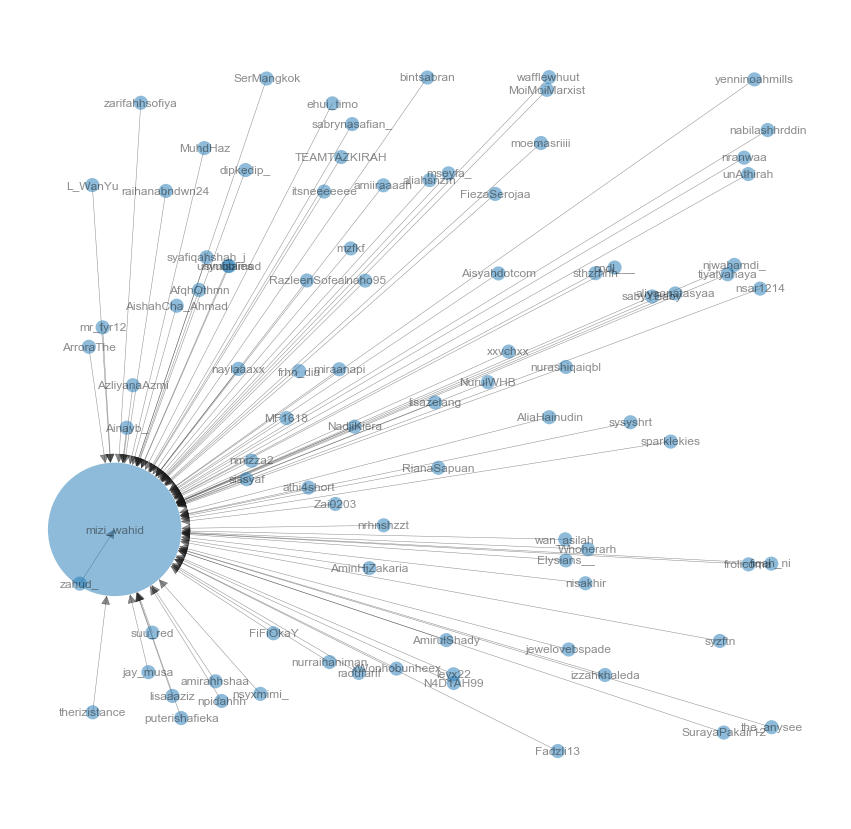

CommunityID:  11
0: 0.037*"degree" + 0.030*"self" + 0.023*"state" + 0.023*"mp" + 0.023*"peacefully" + 0.023*"bound" + 0.023*"15" + 0.023*"year" + 0.023*"respect" + 0.023*"respnbl"
1: 0.023*"nallah" + 0.023*"zombie" + 0.023*"wound" + 0.023*"gruesome" + 0.023*"found" + 0.023*"12" + 0.023*"stab" + 0.023*"aspect" + 0.023*"sucking" + 0.023*"murder"


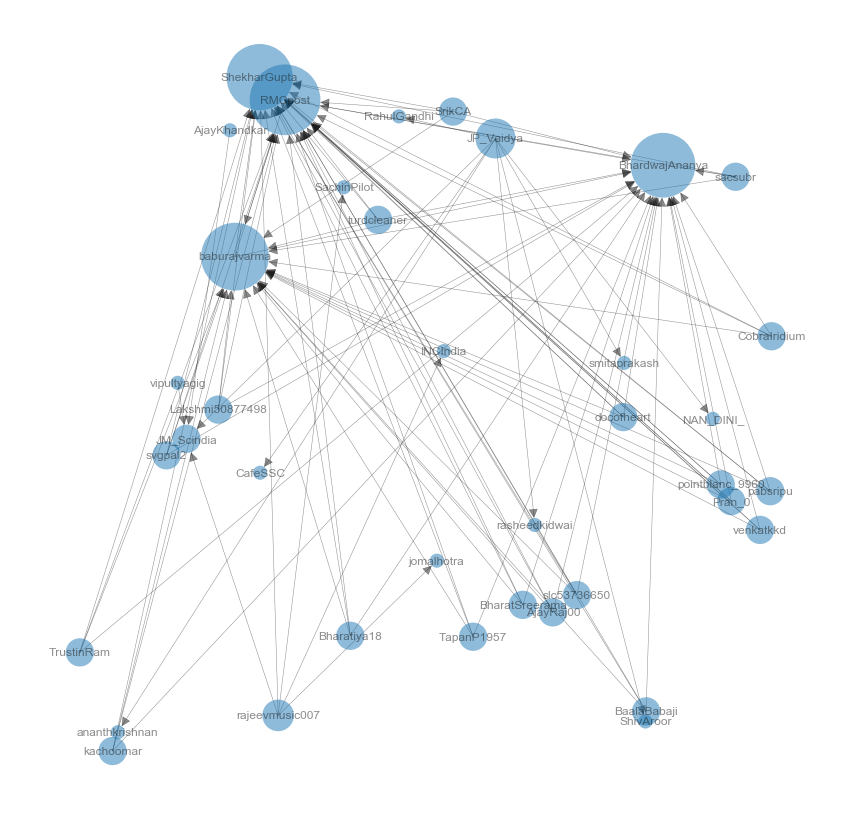

CommunityID:  12
0: 0.046*"worked" + 0.046*"reeking" + 0.046*"insecurity" + 0.046*"hidden" + 0.046*"validation" + 0.046*"self" + 0.046*"profile" + 0.046*"justification" + 0.046*"way" + 0.046*"as"
1: 0.036*"bully" + 0.028*"kneel" + 0.028*"apologise" + 0.028*"funeral" + 0.028*"commits" + 0.028*"teen" + 0.028*"suicide" + 0.028*"sia" + 0.020*"barça" + 0.020*"best"


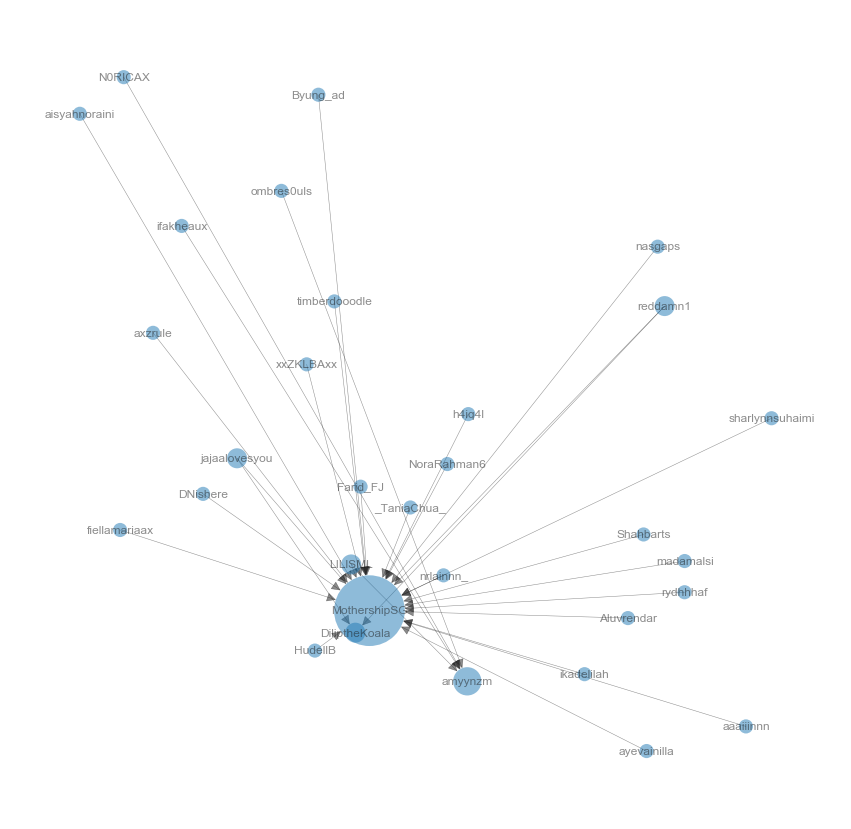

CommunityID:  13
0: 0.031*"system" + 0.026*"u" + 0.021*"end" + 0.018*"even" + 0.016*"saying" + 0.014*"lot" + 0.014*"eye" + 0.014*"cheap" + 0.014*"expensive" + 0.014*"bit"
1: 0.025*"psychological" + 0.023*"abuse" + 0.023*"melania" + 0.023*"anyways" + 0.023*"emotional" + 0.023*"probably" + 0.023*"plenty" + 0.023*"honest" + 0.023*"get" + 0.018*"insomnia"


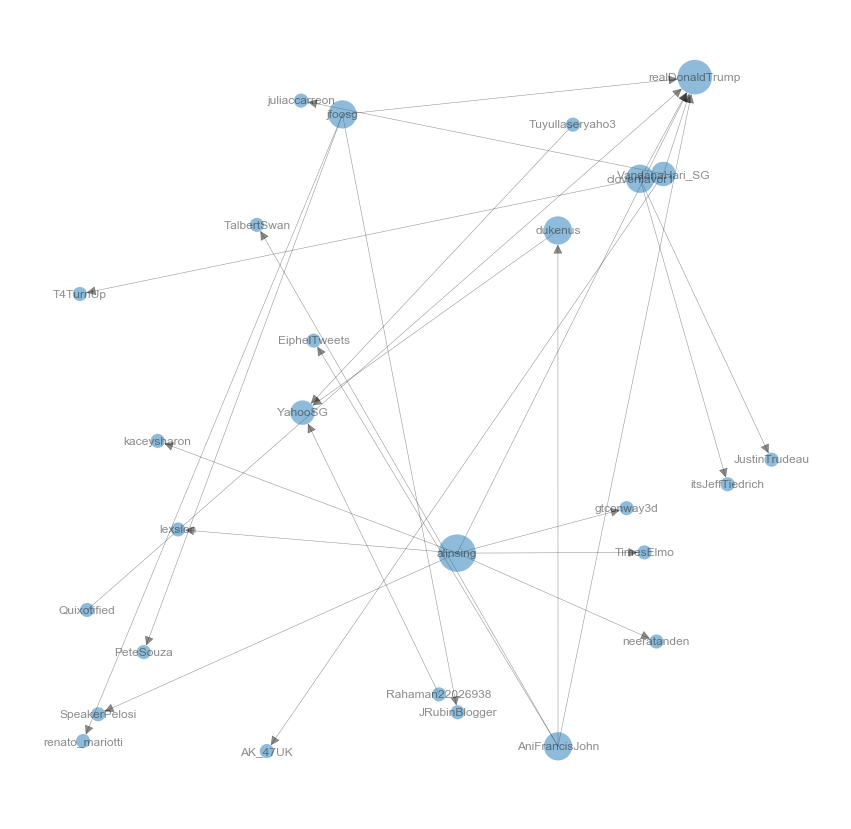

CommunityID:  14
0: 0.067*"beijing" + 0.067*"everyone" + 0.067*"hope" + 0.067*"protection" + 0.067*"take" + 0.067*"stay" + 0.067*"safe" + 0.067*"home" + 0.067*"personal" + 0.067*"continue"
1: 0.067*"self-quarantined" + 0.067*"care" + 0.067*"good" + 0.067*"healthy" + 0.067*"currently" + 0.067*"continue" + 0.067*"personal" + 0.067*"home" + 0.067*"safe" + 0.067*"stay"


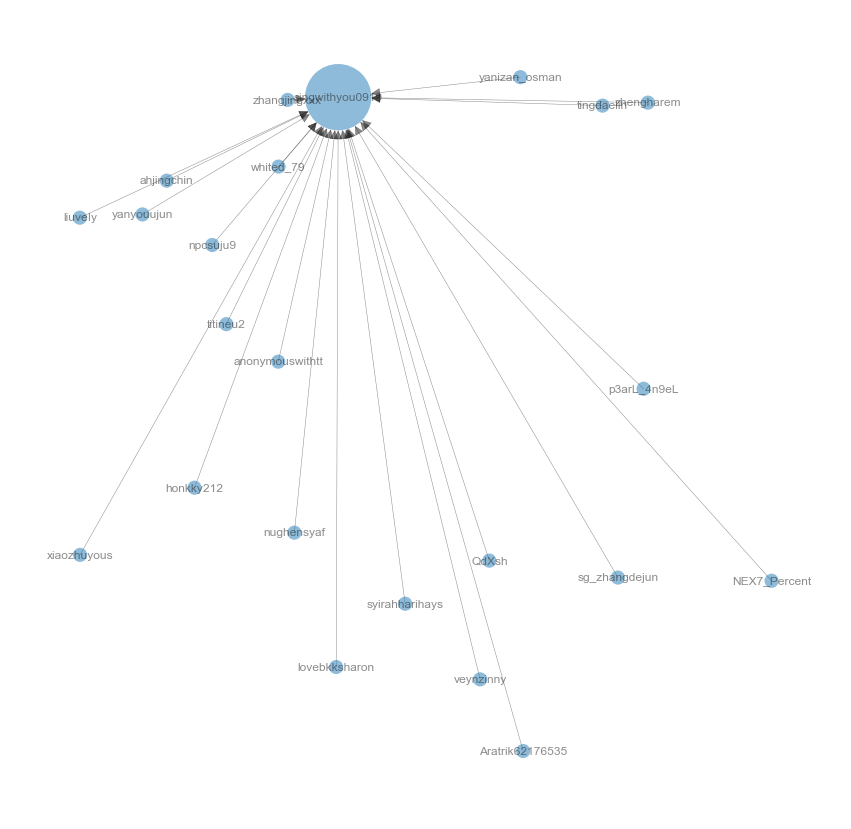

CommunityID:  15
0: 0.071*"part" + 0.071*"admin" + 0.071*"reportedly" + 0.071*"purchase" + 0.071*"pressure" + 0.071*"weapon" + 0.071*"jakarta" + 0.071*"compelled" + 0.071*"russia" + 0.071*"plan"
1: 0.071*"drop" + 0.071*"trump" + 0.071*"prc" + 0.071*"abo…" + 0.071*"plan" + 0.071*"russia" + 0.071*"compelled" + 0.071*"jakarta" + 0.071*"weapon" + 0.071*"pressure"


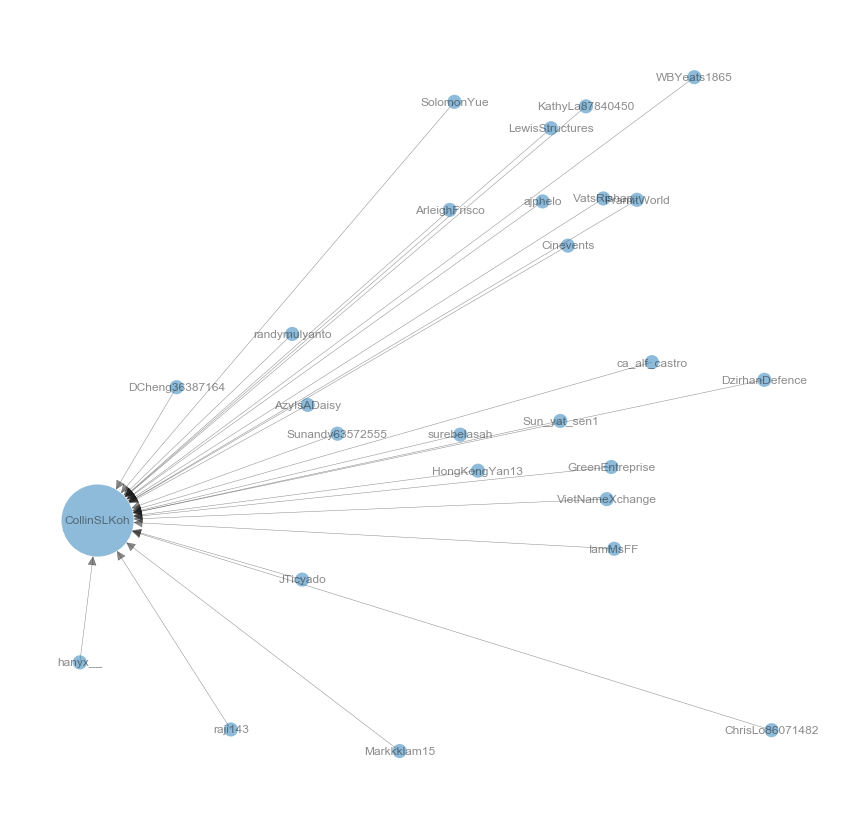

CommunityID:  16
0: 0.030*"video" + 0.025*"part" + 0.022*"overcome" + 0.020*"personality" + 0.019*"ad" + 0.017*"click" + 0.017*"infj" + 0.017*"enfp" + 0.017*"naturally" + 0.017*"depression"
1: 0.035*"coronavirus" + 0.035*"die" + 0.032*"left" + 0.032*"overwhelmed" + 0.032*"'will" + 0.032*"italian" + 0.032*"country" + 0.032*"heartbreaking" + 0.032*"80" + 0.019*"click"


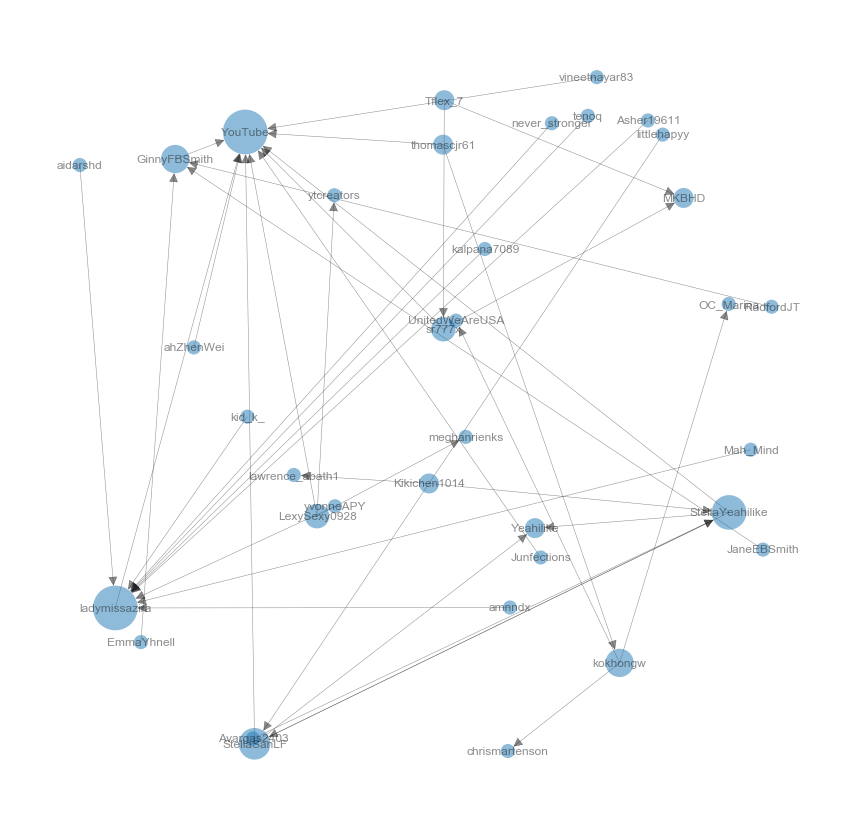

CommunityID:  17
0: 0.172*"plz" + 0.156*"gst" + 0.156*"launch" + 0.156*"2.0" + 0.156*"taxation" + 0.156*"issue" + 0.001*"loss" + 0.001*"report" + 0.001*"business" + 0.001*"thanks"
1: 0.047*"hindu" + 0.040*"caused" + 0.040*"hidden" + 0.040*"crucial" + 0.040*"risk" + 0.040*"nature" + 0.040*"thanks" + 0.040*"business" + 0.040*"report" + 0.040*"loss"


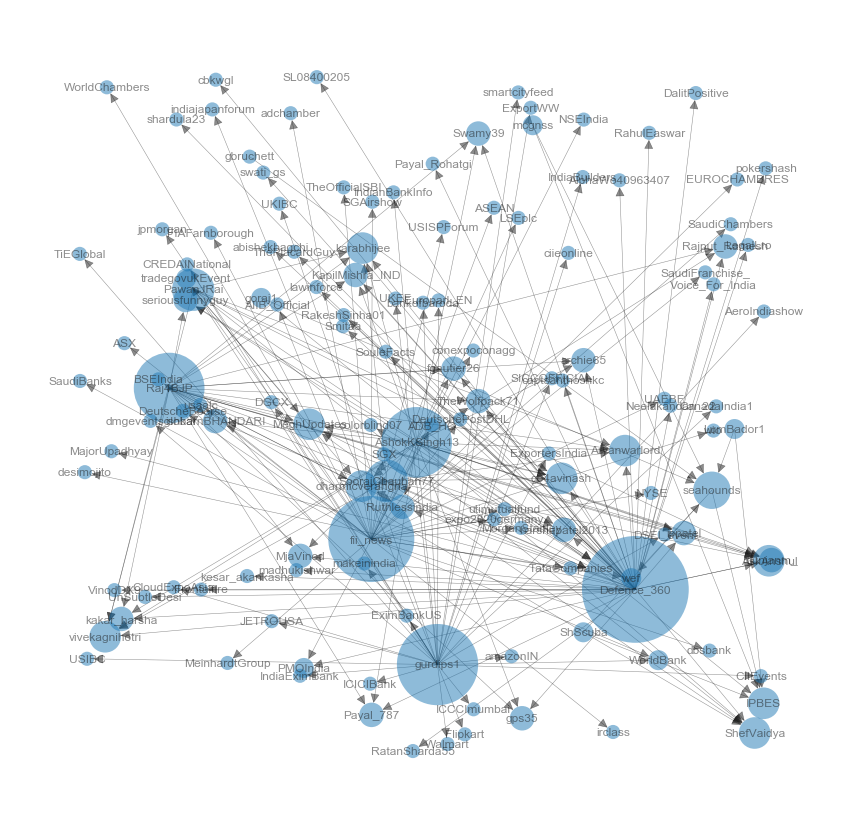

CommunityID:  18
0: 0.010*"anger" + 0.008*"entire" + 0.008*"sad" + 0.008*"towards" + 0.007*"continue" + 0.007*"die" + 0.007*"meet" + 0.007*"race" + 0.007*"holding" + 0.007*"choice"
1: 0.019*"work" + 0.013*"co" + 0.008*"sun" + 0.008*"around" + 0.007*"lol" + 0.007*"health" + 0.007*"bet" + 0.007*"mental" + 0.007*"online" + 0.007*"hub"


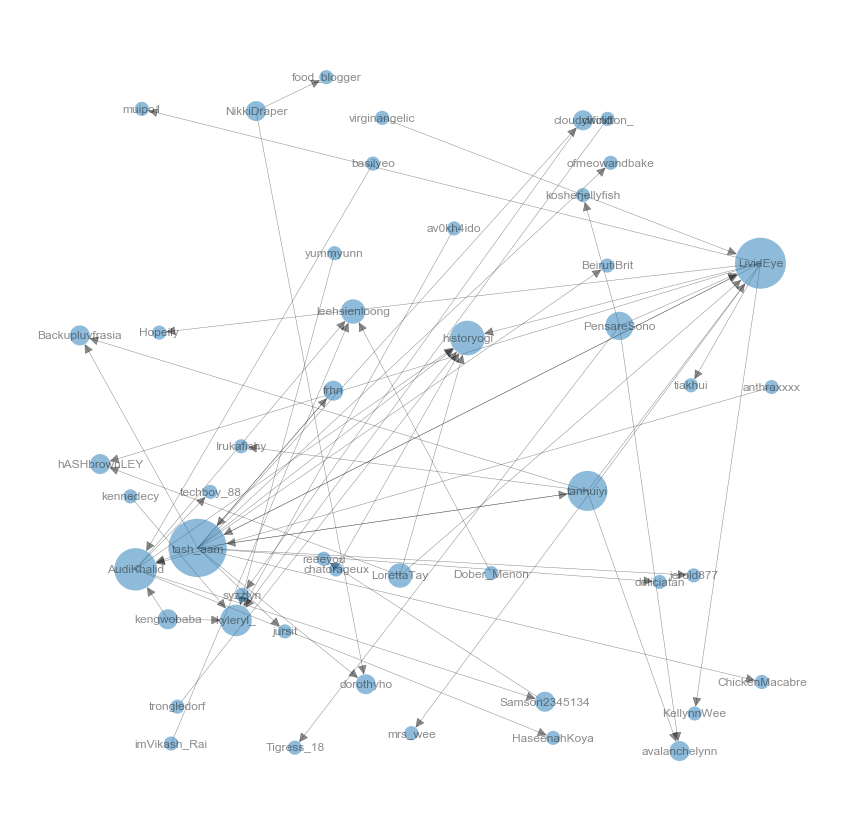

CommunityID:  20
0: 0.193*"he…" + 0.033*"fight" + 0.033*"🤧wonho" + 0.033*"😭🙏❤" + 0.033*"work" + 0.033*"bullying" + 0.033*"time" + 0.033*"chaotic" + 0.033*"think" + 0.033*"😅"
1: 0.084*"support" + 0.076*"x" + 0.044*"reinstatement" + 0.044*"wonhois…" + 0.044*"monsta" + 0.036*"reply" + 0.028*"mbbs" + 0.028*"u" + 0.020*"mx7" + 0.020*"close"


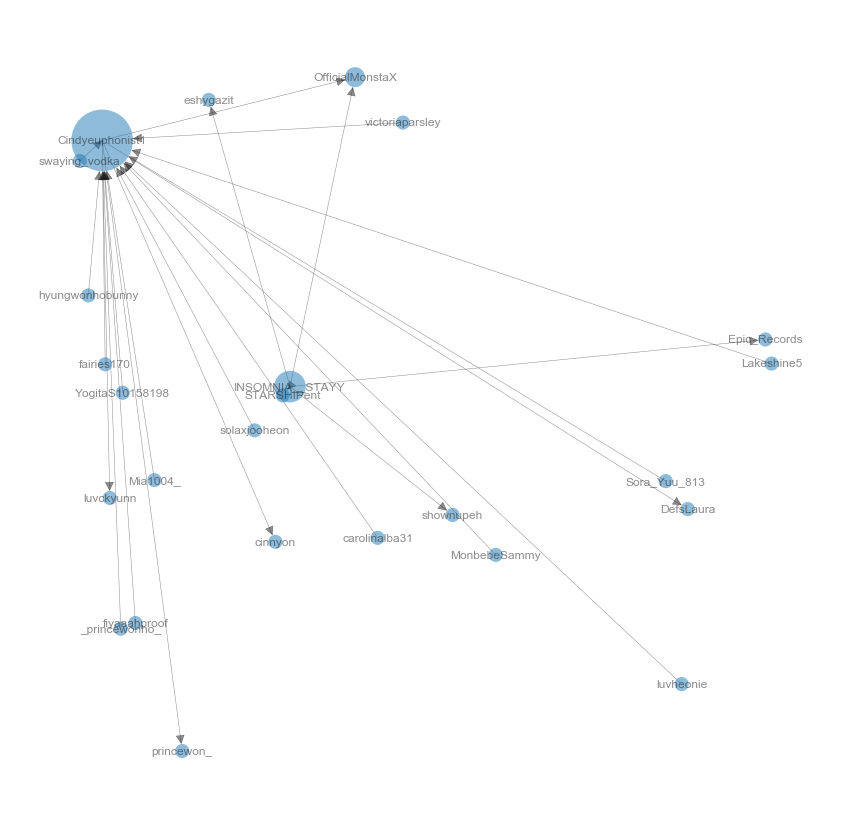

CommunityID:  21
0: 0.231*"young…" + 0.067*"despair" + 0.038*"♡" + 0.037*"missing" + 0.037*"slam" + 0.037*"tuesgetherforever" + 0.037*"find" + 0.037*"soon" + 0.037*"slip" + 0.037*"door"
1: 0.086*"helpless" + 0.086*"mentality" + 0.086*"switch" + 0.086*"healing" + 0.086*"broken" + 0.086*"growing" + 0.086*"watch" + 0.086*"life" + 0.086*"fast" + 0.071*"changes…"


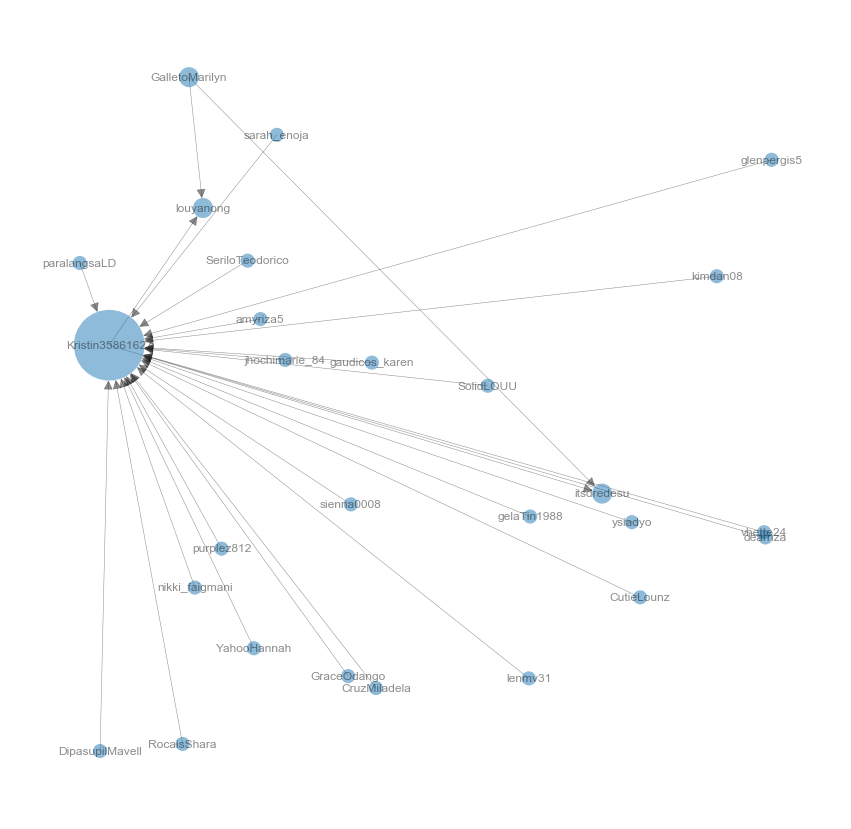

In [100]:
for i in all_communities_list:
    print("CommunityID: ", int(i))
    
    # Deriving a subset of the dataframe using the above list
    tweets_unique_sample = tweets_mw_df_sent_topic_communityID[tweets_mw_df_sent_topic_communityID["CommunityID"] == i]

    # Converting the df clumn of noURLnoMention into a list 
    noURLnoMention_list_A = tweets_unique_sample['noURLnoMention'].tolist()

    # Using our "process_alltweets" functions
    processed = process_alltweets_updated(noURLnoMention_list_A)

    #Your code here to tokenize the processed tweets. ##
    vect_df_token = [word_tokenize(sentence) for sentence in processed]
    dictionary =  gensim.corpora.Dictionary(vect_df_token)

    dictionary.filter_extremes(no_below = 0) # choosing to remove words that are lesser than 5 counts

    corpus_vect = [dictionary.doc2bow(text) for text in vect_df_token]

    num_topics = 2
    ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, 
                                               num_topics = num_topics, 
                                               id2word=dictionary, 
                                               passes=20, 
                                               random_state= 0)

    for num ,topic in ldamodel.show_topics(formatted=True, num_topics=num_topics, num_words=10):
        print(str(num)+": "+ topic)

    G_sg = G.subgraph(top_communities[int(i)])

    # Create random layout positions
    pos = nx.random_layout(G_sg)

    # Figure Size
    plt.figure(figsize = (15,15))

    # Create size list
    sizes = [(v['degreeValues'] * 200) for (u, v) in G_sg.nodes(data=True)]
    # sizes = [x[1]*20 for x in G_sg.degree()]

    # Draw the network
    nx.draw_networkx(G_sg, pos, 
        with_labels = True, 
        node_size = sizes,
        width = 0.5, alpha = 0.5,
        arrowsize = 20, linewidths = 0)

    # Draw the axis based on their weights


    # Turn axis off and show
    plt.axis('off'); plt.show()


In [94]:
# Deriving a subset of the dataframe using the above list
tweets_unique_sample = tweets_mw_df_sent_topic_communityID[tweets_mw_df_sent_topic_communityID["CommunityID"] == 18]
tweets_unique_sample["Text"].values

array(['RT @LividEye: The impact on all the schools is like a tsaunami. You have no idea how much is going on in the backend just for everyone to c…',
       'RT @LividEye: The impact on all the schools is like a tsaunami. You have no idea how much is going on in the backend just for everyone to c…',
       'The impact on all the schools is like a tsaunami. You have no idea how much is going on in the backend just for everyone to come home. The amount of stress everyone is getting from the parents, the management, the ministry... https://t.co/wBpgzSPVdB',
       '@avalanchelynn He asked me dont stress over such things',
       '@Irukafishy Yup... he tells me don’t stress over these things',
       'RT @tash_aam: @tanhuiyi @Backupluvfrasia Online warehouse hubs are all sold out cos of them, I bet - they have to go out and satisfy their…',
       'RT @tash_aam: @tanhuiyi @Backupluvfrasia Online warehouse hubs are all sold out cos of them, I bet - they have to go out and satisfy their…',


#### Observation from the following selected Communities:

##### Community 0 (COVID-19):

0: 0.112*"find" + 0.112*"type" + 0.112*"t…" + 0.112*"lot" + 0.112*"ableist" + 0.112*"right" + 0.112*"exactly" + 0.112*"rhetoric" + 0.013*"take" + 0.013*"distract"
1: 0.147*"take" + 0.088*"mental" + 0.088*"health" + 0.088*"socialdistancing" + 0.088*"care" + 0.088*"break" + 0.088*"sure" + 0.088*"distract" + 0.030*"rhetoric" + 0.030*"exactly"

In the midst of covid-19, there seems to be evidence that people agree with @NabaNaseer that the presence of covid-19 has its effects on mental wellness. Partly attributed to the stresses of getting it, as well as the social distancing. 

##### Community 1 (Sensitive to K-Pop):

CommunityID:  1
0: 0.123*"fucking" + 0.113*"want" + 0.113*"happening" + 0.113*"dont" + 0.113*"life" + 0.103*"only…" + 0.015*"useless" + 0.015*"feel" + 0.015*"thing" + 0.015*"good"
1: 0.051*"ago" + 0.051*"taeyeon" + 0.051*"hence" + 0.051*"spin" + 0.051*"made" + 0.051*"fan" + 0.051*"tonight" + 0.051*"instead" + 0.051*"skill" + 0.051*"since"

This community is highly shaped by the Korean Pop Star community.. Languages used are very strong, which further emphasise how this community has it's mental wellness highly tied to the news of pop stars

##### Community 3 (Relationship issues):

0: 0.093*"look" + 0.093*"even" + 0.093*"u" + 0.093*"lol" + 0.093*"pretty" + 0.093*"struggle" + 0.032*"tired" + 0.031*"sick" + 0.022*"putting" + 0.022*"straight"
1: 0.055*"suka" + 0.055*"build" + 0.055*"senang" + 0.055*"islam" + 0.055*"wedding" + 0.055*"unne…" + 0.055*"stigma" + 0.055*"ikut" + 0.055*"part" + 0.055*"big"

Found a community of users who tend to agree with a couple of strong voices that echo sentiments of displeasure on people. Issues likely revolve relationships because it's always an emotional tie to partners, contains weddings, and ideas of looking pretty. 

##### Community 4 (Indian Govt, with COVID 19 issues) (Neg):

0: 0.086*"government" + 0.086*"provide" + 0.086*"want" + 0.086*"mask" + 0.086*"taxpayer" + 0.086*"on…" + 0.086*"money" + 0.086*"sanitizers" + 0.086*"shaheenbagh" + 0.086*"spent"
1: 0.056*"fight" + 0.056*"india" + 0.043*"ancient" + 0.043*"medical" + 0.043*"harvard" + 0.043*"pranayama" + 0.043*"breath" + 0.043*"covid-…" + 0.043*"school" + 0.043*"blog"

Found a community that's retweeting issues related to the Indian government. Instances of depression related articles are aobserved - peer pressure, social anxiety. However, as is noticed on other communities, the community is in discussion on topics related to covid-19 as well.

##### Community 5 (Awareness issues):

0: 0.054*"anyone" + 0.037*"never" + 0.037*"true" + 0.037*"lie" + 0.037*"depressed" + 0.036*"fun" + 0.036*"bored" + 0.036*"till" + 0.031*"personal" + 0.031*"nobody"
1: 0.121*"love" + 0.066*"always" + 0.064*"keep" + 0.062*"wan" + 0.060*"mental" + 0.060*"ta" + 0.060*"illness" + 0.034*"lookout" + 0.033*"everything" + 0.033*"please"

A similar kind of community to 3, but with lesser relation to relationships. It has tweets with regards to awareness on this issue.

##### Community 6 (News Channel Community):

0: 0.039*"school" + 0.035*"student" + 0.033*"bullying" + 0.033*"toh" + 0.033*"incident" + 0.033*"mee" + 0.031*"principal" + 0.029*"disciplined" + 0.029*"differentiates" + 0.029*"covid-19"
1: 0.047*"10" + 0.043*"coronavirus" + 0.033*"die" + 0.030*"uk" + 0.020*"year" + 0.019*"taunted" + 0.019*"schoolmate" + 0.019*"'ugly" + 0.019*"'fat" + 0.019*"—"

This community, as it's high in degree centrality nodes are news channels, reflect the current social issues that the world is facing - COVID 19. Perhaps the recency of news that is pulled means other topics are also retweeted (tho not reflective of the commmnity here) on bullying. 

##### Community 7 (A voice of self-caring):

CommunityID:  7
0: 0.032*"maybe" + 0.032*"daily" + 0.026*"know" + 0.026*"body" + 0.026*"tired" + 0.026*"depressed" + 0.026*"sad" + 0.026*"fighting" + 0.026*"exhausted" + 0.017*"constantly"
1: 0.039*"and…" + 0.036*"selfcare" + 0.034*"picture" + 0.034*"le" + 0.034*"magazine" + 0.034*"energy" + 0.034*"becomes" + 0.034*"painted" + 0.034*"limited" + 0.034*"glamorous"

A high in degree central node by the alias of @AChVoice had me deep diving. This user articulates #chronicillness from various #perspectives. This is a community that raises topics that promotes encouragement in the face of things that would impact one's mental wellness. 

##### Community 8 (K-Pop - with a retweeting topic on just insomnia):

CommunityID:  8
0: 0.199*"new" + 0.199*"stanned" + 0.199*"yea" + 0.040*"ever" + 0.040*"never" + 0.040*"chart" + 0.040*"shak…" + 0.040*"today" + 0.040*"thought" + 0.040*"lisakko"
1: 0.104*"lisa" + 0.104*"dreamcatcher" + 0.104*"lisakko" + 0.104*"thought" + 0.104*"today" + 0.104*"chart" + 0.104*"never" + 0.104*"ever" + 0.075*"shak…" + 0.045*"shaking"

This topic is about a group of followers who are continuously retweeting a KPOP celebrity over a photo that describes "things with insomnia". While raising a word that has some relation to mental wellness, there was no "concern" about this topic. Primarily, it focuses on the "come-together" of 2 famous KPOP celebrities.

##### Community 9 (A Muslim Advocate who promotes mental wellness by trusting in their god):

CommunityID:  9
0: 0.085*"many" + 0.085*"stressed" + 0.085*"stress" + 0.085*"forward" + 0.085*"yet" + 0.085*"want" + 0.085*"drive" + 0.085*"ppl" + 0.085*"m…" + 0.029*"caring"
1: 0.108*"feeling" + 0.108*"protect" + 0.108*"lot" + 0.108*"enough" + 0.108*"ending" + 0.108*"mindful" + 0.108*"risk" + 0.108*"caring" + 0.015*"m…" + 0.015*"ppl"

This community, continually retweets a user with alias @mizi_wahid. He is an author who published a book on religious faith - highlighting to trust in their god. People who retweet are likely those who endorse/agree. Hence, it's likely that this is a community of users who place faith as an importance in their lives. 

##### Community 11 (Angst and Rage over lost life and politics in INdia):

CommunityID:  11
0: 0.037*"degree" + 0.030*"self" + 0.023*"state" + 0.023*"mp" + 0.023*"peacefully" + 0.023*"bound" + 0.023*"15" + 0.023*"year" + 0.023*"respect" + 0.023*"respnbl"
1: 0.023*"nallah" + 0.023*"zombie" + 0.023*"wound" + 0.023*"gruesome" + 0.023*"found" + 0.023*"12" + 0.023*"stab" + 0.023*"aspect" + 0.023*"sucking" + 0.023*"murder"

This community expresses anger and injustice in the lost of one person's life - an IB officer - and the politics tied to the indian government.

##### Community 12 (News of school bullying):

CommunityID:  12
0: 0.046*"worked" + 0.046*"reeking" + 0.046*"insecurity" + 0.046*"hidden" + 0.046*"validation" + 0.046*"self" + 0.046*"profile" + 0.046*"justification" + 0.046*"way" + 0.046*"as"
1: 0.036*"bully" + 0.028*"kneel" + 0.028*"apologise" + 0.028*"funeral" + 0.028*"commits" + 0.028*"teen" + 0.028*"suicide" + 0.028*"sia" + 0.020*"barça" + 0.020*"best"

This community expresses a network of tweets about the news of bullying. The facts here belong to issues from Malaysia and Singapore. 
 
##### Community 13 (A set of tweets related to America's Donald Trump and issues about COVID-19)

CommunityID:  13
0: 0.031*"system" + 0.026*"u" + 0.021*"end" + 0.018*"even" + 0.016*"saying" + 0.014*"lot" + 0.014*"eye" + 0.014*"cheap" + 0.014*"expensive" + 0.014*"bit"
1: 0.025*"psychological" + 0.023*"abuse" + 0.023*"melania" + 0.023*"anyways" + 0.023*"emotional" + 0.023*"probably" + 0.023*"plenty" + 0.023*"honest" + 0.023*"get" + 0.018*"insomnia"

##### Communiy 14 (celebrity):

CommunityID:  14
0: 0.067*"beijing" + 0.067*"everyone" + 0.067*"hope" + 0.067*"protection" + 0.067*"take" + 0.067*"stay" + 0.067*"safe" + 0.067*"home" + 0.067*"personal" + 0.067*"continue"
1: 0.067*"self-quarantined" + 0.067*"care" + 0.067*"good" + 0.067*"healthy" + 0.067*"currently" + 0.067*"continue" + 0.067*"personal" + 0.067*"home" + 0.067*"safe" + 0.067*"stay"

This is a community that is retweeting on the safe returns of a celebrity in the face of COVID 19

##### Communiy 15 (Unrelated):

CommunityID:  15
0: 0.071*"part" + 0.071*"admin" + 0.071*"reportedly" + 0.071*"purchase" + 0.071*"pressure" + 0.071*"weapon" + 0.071*"jakarta" + 0.071*"compelled" + 0.071*"russia" + 0.071*"plan"
1: 0.071*"drop" + 0.071*"trump" + 0.071*"prc" + 0.071*"abo…" + 0.071*"plan" + 0.071*"russia" + 0.071*"compelled" + 0.071*"jakarta" + 0.071*"weapon" + 0.071*"pressure"

Not related to mental wellness

##### Communiy 16 (Mutli-faceted topics mentioned within this community):

CommunityID:  16
0: 0.030*"video" + 0.025*"part" + 0.022*"overcome" + 0.020*"personality" + 0.019*"ad" + 0.017*"click" + 0.017*"infj" + 0.017*"enfp" + 0.017*"naturally" + 0.017*"depression"
1: 0.035*"coronavirus" + 0.035*"die" + 0.032*"left" + 0.032*"overwhelmed" + 0.032*"'will" + 0.032*"italian" + 0.032*"country" + 0.032*"heartbreaking" + 0.032*"80" + 0.019*"click"

Contents include COVID-19, therapy, spiriual wellness. 

##### Communiy 17 (Unrelated):

CommunityID:  17
0: 0.172*"plz" + 0.156*"gst" + 0.156*"launch" + 0.156*"2.0" + 0.156*"taxation" + 0.156*"issue" + 0.001*"loss" + 0.001*"report" + 0.001*"business" + 0.001*"thanks"
1: 0.047*"hindu" + 0.040*"caused" + 0.040*"hidden" + 0.040*"crucial" + 0.040*"risk" + 0.040*"nature" + 0.040*"thanks" + 0.040*"business" + 0.040*"report" + 0.040*"loss"

This is a spam community.

##### Communiy 18 (a genuine community that openly shares and retweets one another on topics related to mental wellness)

CommunityID:  18
0: 0.010*"anger" + 0.008*"entire" + 0.008*"sad" + 0.008*"towards" + 0.007*"continue" + 0.007*"die" + 0.007*"meet" + 0.007*"race" + 0.007*"holding" + 0.007*"choice"
1: 0.019*"work" + 0.013*"co" + 0.008*"sun" + 0.008*"around" + 0.007*"lol" + 0.007*"health" + 0.007*"bet" + 0.007*"mental" + 0.007*"online" + 0.007*"hub"

##### Communiy 20 (celebrity):

CommunityID:  20
0: 0.193*"he…" + 0.033*"fight" + 0.033*"🤧wonho" + 0.033*"😭🙏❤" + 0.033*"work" + 0.033*"bullying" + 0.033*"time" + 0.033*"chaotic" + 0.033*"think" + 0.033*"😅"
1: 0.084*"support" + 0.076*"x" + 0.044*"reinstatement" + 0.044*"wonhois…" + 0.044*"monsta" + 0.036*"reply" + 0.028*"mbbs" + 0.028*"u" + 0.020*"mx7" + 0.020*"close"

A community that is unrelated to mental depression, but about a celebrity. Another spam community. 

##### Communiy 21 (An individual that's promoting mental wellness by affirming how others can switch their mindsets):

CommunityID:  21
0: 0.231*"young…" + 0.067*"despair" + 0.038*"♡" + 0.037*"missing" + 0.037*"slam" + 0.037*"tuesgetherforever" + 0.037*"find" + 0.037*"soon" + 0.037*"slip" + 0.037*"door"
1: 0.086*"helpless" + 0.086*"mentality" + 0.086*"switch" + 0.086*"healing" + 0.086*"broken" + 0.086*"growing" + 0.086*"watch" + 0.086*"life" + 0.086*"fast" + 0.071*"changes…"

In [ ]:
test_groupby = tweets_mw_df_sent_topic_communityID.groupby(['CommunityID']).mean()

pos_communities_list = list(test_groupby[test_groupby["VADER_pos"] > test_groupby["VADER_neg"]].index)
pos_communities_list

In [869]:
pos_communities_list.remove(2.0)

In [870]:
pos_communities_list

[0.0, 1.0, 3.0, 5.0, 6.0, 7.0, 14.0, 17.0, 20.0]

CommunityID:  0
0: 0.112*"find" + 0.112*"type" + 0.112*"t…" + 0.112*"lot" + 0.112*"ableist" + 0.112*"right" + 0.112*"exactly" + 0.112*"rhetoric" + 0.013*"take" + 0.013*"distract"
1: 0.147*"take" + 0.088*"mental" + 0.088*"health" + 0.088*"socialdistancing" + 0.088*"care" + 0.088*"break" + 0.088*"sure" + 0.088*"distract" + 0.030*"rhetoric" + 0.030*"exactly"


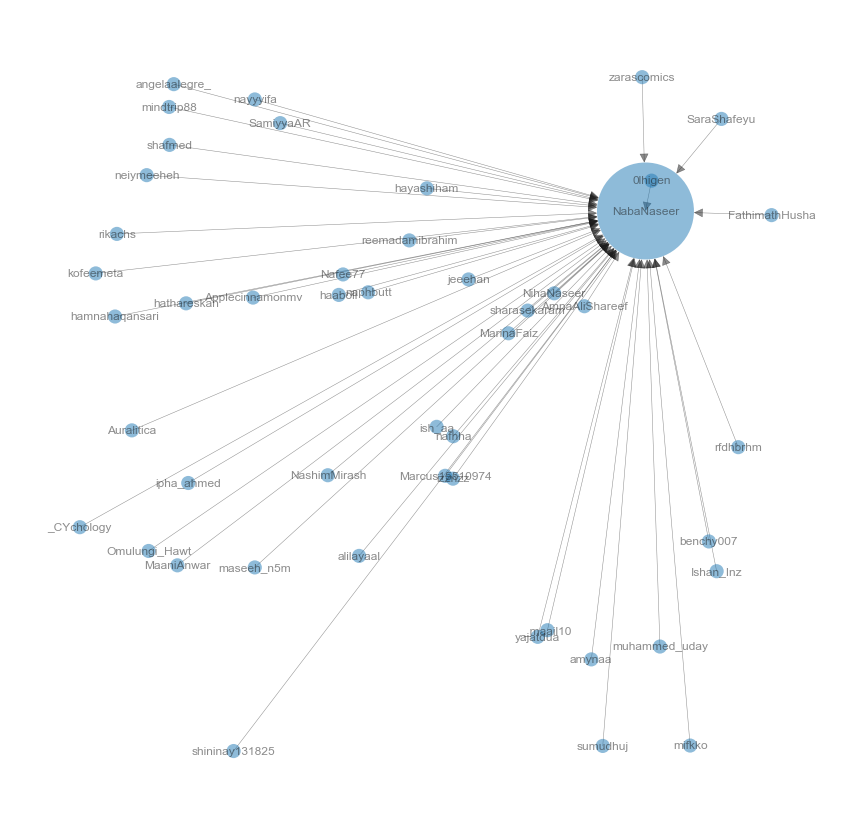

CommunityID:  1
0: 0.123*"fucking" + 0.113*"want" + 0.113*"happening" + 0.113*"dont" + 0.113*"life" + 0.103*"only…" + 0.015*"useless" + 0.015*"feel" + 0.015*"thing" + 0.015*"good"
1: 0.051*"ago" + 0.051*"taeyeon" + 0.051*"hence" + 0.051*"spin" + 0.051*"made" + 0.051*"fan" + 0.051*"tonight" + 0.051*"instead" + 0.051*"skill" + 0.051*"since"


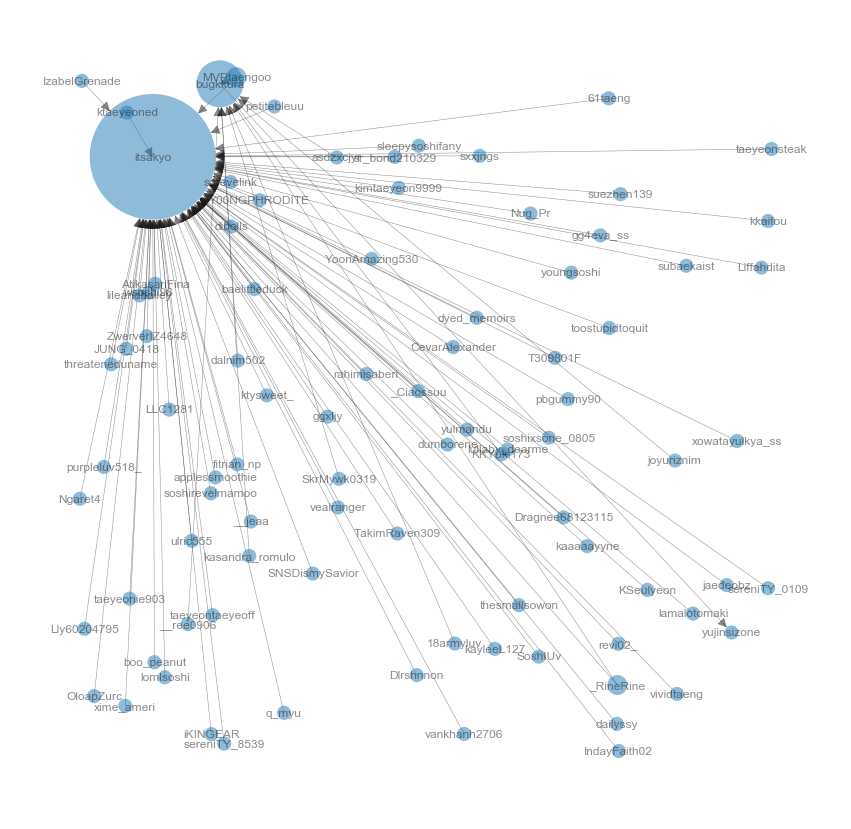

CommunityID:  2


ValueError: cannot compute LDA over an empty collection (no terms)

In [58]:
for i in pos_communities_list:
    print("CommunityID: ", int(i))
    
    # Deriving a subset of the dataframe using the above list
    tweets_unique_sample = tweets_mw_df_sent_topic_communityID[tweets_mw_df_sent_topic_communityID["CommunityID"] == i]

    # Converting the df clumn of noURLnoMention into a list 
    noURLnoMention_list_A = tweets_unique_sample['noURLnoMention'].tolist()

    # Using our "process_alltweets" functions
    processed = process_alltweets_updated(noURLnoMention_list_A)

    #Your code here to tokenize the processed tweets. ##
    vect_df_token = [word_tokenize(sentence) for sentence in processed]
    dictionary =  gensim.corpora.Dictionary(vect_df_token)

    dictionary.filter_extremes(no_below = 0) # choosing to remove words that are lesser than 5 counts

    corpus_vect = [dictionary.doc2bow(text) for text in vect_df_token]

    num_topics = 2
    ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, 
                                               num_topics = num_topics, 
                                               id2word=dictionary, 
                                               passes=20, 
                                               random_state= 0)

    for num ,topic in ldamodel.show_topics(formatted=True, num_topics=num_topics, num_words=10):
        print(str(num)+": "+ topic)

    G_sg = G.subgraph(top_communities[int(i)])

    # Create random layout positions
    pos = nx.random_layout(G_sg)

    # Figure Size
    plt.figure(figsize = (15,15))

    # Create size list
    sizes = [(v['degreeValues'] * 200) for (u, v) in G_sg.nodes(data=True)]
    # sizes = [x[1]*20 for x in G_sg.degree()]

    # Draw the network
    nx.draw_networkx(G_sg, pos, 
        with_labels = True, 
        node_size = sizes,
        width = 0.5, alpha = 0.5,
        arrowsize = 20, linewidths = 0)

    # Draw the axis based on their weights


    # Turn axis off and show
    plt.axis('off'); plt.show()


#### Observation from the following selected Communities:

##### Community 0:
In the midst of covid-19, there seems to be evidence that people agree with @NabaNaseer that the presence of covid-19 has its effects on mental wellness. Partly attributed to the stresses of getting it, as well as the social distancing. 

##### Community 1 (Sensitive to K-Pop):
This community is highly shaped by the Korean Pop Star community.. Languages used are very strong, which further emphasise how this community has it's mental wellness highly tied to the news of pop stars

##### Community 3 (Relationship issues):
Found a community of users who tend to agree with a couple of strong voices that echo sentiments of displeasure on people. Issues likely revolve relationships because it's always an emotional tie to partners, contains weddings, and ideas of looking pretty. 

##### Community 5 (Awareness issues):
A similar kind of community to 3, but with lesser relation to relationships. It has tweets with regards to awareness on this issue.

##### Community 6 (News Channel Community):
This community, as it's high in degree centrality nodes are news channels, reflect the current social issues that the world is facing - COVID 19. Perhaps the recency of news that is pulled means other topics are also retweeted (tho not reflective of the commmnity here) on bullying. 

##### Community 7 (A voice of self-caring):
A high in degree central node by the alias of @AChVoice had me deep diving. This user articulates #chronicillness from various #perspectives. This is a community that raises topics that promotes encouragement in the face of things that would impact one's mental wellness. 

##### Communiy 14 (celebrity):
This is a community that is retweeting on the safe returns of a celebrity in the face of COVID 19

##### Communiy 17 (celebrity):
This is a spam community.

##### Communiy 20 (celebrity):
A community that is unrelated to mental depression, but about a celebrity. Another spam community. 

In [882]:
pos_communities_list

[0.0, 1.0, 3.0, 5.0, 6.0, 7.0, 14.0, 17.0, 20.0]

In [92]:
# Deriving a subset of the dataframe using the above list
tweets_unique_sample = tweets_mw_df_sent_topic_communityID[tweets_mw_df_sent_topic_communityID["CommunityID"] == 18]
tweets_unique_sample["Text"].values

array(['RT @LividEye: The impact on all the schools is like a tsaunami. You have no idea how much is going on in the backend just for everyone to c…',
       'RT @LividEye: The impact on all the schools is like a tsaunami. You have no idea how much is going on in the backend just for everyone to c…',
       'The impact on all the schools is like a tsaunami. You have no idea how much is going on in the backend just for everyone to come home. The amount of stress everyone is getting from the parents, the management, the ministry... https://t.co/wBpgzSPVdB',
       '@avalanchelynn He asked me dont stress over such things',
       '@Irukafishy Yup... he tells me don’t stress over these things',
       'RT @tash_aam: @tanhuiyi @Backupluvfrasia Online warehouse hubs are all sold out cos of them, I bet - they have to go out and satisfy their…',
       'RT @tash_aam: @tanhuiyi @Backupluvfrasia Online warehouse hubs are all sold out cos of them, I bet - they have to go out and satisfy their…',


In [14]:
# Converting the df clumn of noURLnoMention into a list 
noURLnoMention_list = tweets_unique['noURLnoMention'].tolist()

# Using our "process_alltweets" functions
processed = process_alltweets_updated(noURLnoMention_list)

In [53]:
#Your code here to tokenize the processed tweets. ##
vect_df_token = [word_tokenize(sentence) for sentence in processed]
dictionary =  gensim.corpora.Dictionary(vect_df_token)

dictionary.filter_extremes(no_below=5) # choosing to remove words that are lesser than 5 counts

corpus_vect = [dictionary.doc2bow(text) for text in vect_df_token]

num_topics = 6
ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, 
                                           num_topics = num_topics, 
                                           id2word=dictionary, 
                                           passes=20, 
                                           random_state= 0)

for num ,topic in ldamodel.show_topics(formatted=True, num_topics=num_topics, num_words=10):
    print(str(num)+": "+ topic)

0: 0.021*"sanity" + 0.020*"time" + 0.017*"even" + 0.012*"worry" + 0.011*"think" + 0.009*"well" + 0.009*"feel" + 0.009*"find" + 0.009*"peace" + 0.008*"still"
1: 0.019*"work" + 0.015*"insane" + 0.014*"tired" + 0.013*"look" + 0.012*"confusion" + 0.011*"crazy" + 0.011*"time" + 0.011*"please" + 0.010*"hair" + 0.009*"want"
2: 0.027*"psychological" + 0.015*"health" + 0.013*"social" + 0.013*"sad" + 0.013*"use" + 0.012*"mental" + 0.011*"know" + 0.010*"already" + 0.010*"case" + 0.009*"time"
3: 0.046*"resilience" + 0.045*"psychology" + 0.018*"help" + 0.012*"insecurity" + 0.012*"life" + 0.010*"year" + 0.009*"world" + 0.009*"market" + 0.009*"take" + 0.009*"pls"
4: 0.022*"today" + 0.019*"u" + 0.018*"keep" + 0.016*"big" + 0.015*"energy" + 0.014*"struggle" + 0.013*"self" + 0.013*"front" + 0.012*"home" + 0.011*"even"
5: 0.047*"meditation" + 0.015*"good" + 0.011*"last" + 0.011*"feel" + 0.010*"life" + 0.009*"woman" + 0.008*"depression" + 0.008*"day" + 0.008*"risk" + 0.007*"feeling"


In [58]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamodel, texts=vect_df_token, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

KeyboardInterrupt: 

In [18]:
score_tuple = []
for i in range(1,20):
        num_topic = i
        ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, num_topics = num_topic, id2word=dictionary, passes=20, random_state= 0)
        
        # Compute Coherence Score
        coherence_model_lda = CoherenceModel(model=ldamodel, texts=vect_df_token, dictionary=dictionary, coherence='c_v')
        coherence_lda = coherence_model_lda.get_coherence()
        
        output = [num_topic, coherence_lda]
        score_tuple.append(output)
        
        print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.47331975655057057


KeyboardInterrupt: 

Observation: From the above graph, while the choice of k = 8 gives a relatively good coherent score of 0.463, the interpretation was found to be trickier as there was overlapping of words. 

In [97]:
# creating of function
def split(listvalue):
    return [char for char in listvalue]

# creating a stopwords list
stop_list = stopwords.words("english") + split(string.punctuation) + ['link','rt'] + ['are','have','will','already','want','psychological','still','everything','help','feel','ever','time','know','r',"'",'ad','bc',"'ve","'ll",'back','ca','part','something','infj','front','v','enfp','ha','wa','n','every','even','ok','lol',"•",'wan','pls','gon', "…",'...',"''","..","--","“","”","’","–","u","im",'amp','gt','get','much','also','2','1','3','4','5','6','7','8','9','0','messy','got','would','na','people','year','lonely','need','like','come','read','one','day','let','singapore',"not",'see',"n't",'via','thing','go','mean','make','really',"'re",'pm']

# re-using the function from SMT202 assignment 1 to process our tweets
def process_alltweets_updated(listtweets):
    
    listtweets_noURL = [] # this would be an empty list to collect tweets stripped of URL
    lemma_tweets = [] # for storing lemmatized tweets
    clean_data = [] # for storing clean data
    processed = [] # for storing 1st replacement of punctuated letters
    processed_1 = [] # for storing 2nd removal of punctuated letters
    
    # removal of URLs and @mentions
    for sentences in listtweets:
        output = re.sub('http\S+|@\w+|www\S+', '', sentences, flags = re.MULTILINE)
        listtweets_noURL.append(output)
    
    # tokenization
    tokenized_tweets = [word_tokenize(tweet) for tweet in listtweets_noURL]
    
    # stopword, punctuation, link, rt removal
    # converting them to lower case
    for tweet in tokenized_tweets:
        output = [WNL.lemmatize(word) for word in tweet]
        # output = [word.lower() for word in tweet if word.lower() not in stop_list]
        clean_data.append(output)
        
    # lemmatization
    for tweet in clean_data:
        output = [word.lower() for word in tweet if word.lower() not in stop_list]
        # output = [WNL.lemmatize(word) for word in tweet]
        lemma_tweets.append(" ".join(output))
        
    # 1st replacement of punctuated letters
    for sentences in lemma_tweets:
        output = re.sub(r"n't", 'not', sentences, flags = re.MULTILINE)
        processed.append(output)
        
    # 2nd removal of punctuated letters
    for sentences in processed:
        output = re.sub("'[smd]|`", '', sentences, flags = re.MULTILINE)
        processed_1.append(output)
    
    return processed_1

# Converting the df clumn of noURLnoMention into a list 
noURLnoMention_list = tweets_unique['noURLnoMention'].tolist()

# Using our "process_alltweets" functions
processed = process_alltweets_updated(noURLnoMention_list)


#Your code here to tokenize the processed tweets. ##
vect_df_token = [word_tokenize(sentence) for sentence in processed]
dictionary =  gensim.corpora.Dictionary(vect_df_token)

dictionary.filter_extremes(no_below=5) # choosing to remove words that are lesser than 5 counts

corpus_vect = [dictionary.doc2bow(text) for text in vect_df_token]

num_topics = 7
ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, 
                                           num_topics = num_topics, 
                                           id2word=dictionary, 
                                           passes=20, 
                                           random_state= 0)

for num ,topic in ldamodel.show_topics(formatted=True, num_topics=num_topics, num_words=10):
    print(str(num)+": "+ topic)


<>:19: DeprecationWarning: invalid escape sequence \S
<>:19: DeprecationWarning: invalid escape sequence \S
<>:19: DeprecationWarning: invalid escape sequence \S
<ipython-input-97-0b5642b472b7>:19: DeprecationWarning: invalid escape sequence \S
  output = re.sub('http\S+|@\w+|www\S+', '', sentences, flags = re.MULTILINE)


0: 0.022*"struggle" + 0.016*"health" + 0.016*"die" + 0.014*"say" + 0.013*"maybe" + 0.013*"suicide" + 0.013*"dont" + 0.013*"mental" + 0.011*"choose" + 0.011*"nothing"
1: 0.016*"panic" + 0.015*"community" + 0.014*"coronavirus" + 0.013*"test" + 0.012*"hope" + 0.011*"pressure" + 0.011*"peace" + 0.011*"everyone" + 0.010*"end" + 0.008*"dear"
2: 0.016*"self" + 0.014*"disorder" + 0.013*"sad" + 0.012*"care" + 0.012*"therapy" + 0.010*"depression" + 0.010*"keep" + 0.010*"cause" + 0.010*"struggle" + 0.009*"shit"
3: 0.043*"psychology" + 0.035*"sanity" + 0.014*"someone" + 0.014*"confusion" + 0.013*"well" + 0.013*"new" + 0.012*"social" + 0.011*"face" + 0.011*"must" + 0.010*"deserve"
4: 0.064*"meditation" + 0.015*"love" + 0.015*"work" + 0.014*"right" + 0.014*"look" + 0.012*"night" + 0.010*"woman" + 0.010*"free" + 0.009*"money" + 0.009*"hair"
5: 0.026*"tired" + 0.021*"today" + 0.018*"home" + 0.016*"big" + 0.015*"energy" + 0.014*"good" + 0.014*"friend" + 0.013*"worry" + 0.013*"thanks" + 0.012*"taurus"
6

In [95]:
# creating of function
def split(listvalue):
    return [char for char in listvalue]

# creating a stopwords list
stop_list = stopwords.words("english") + split(string.punctuation) + ['link','rt'] + ['are','have','will','already','want','psychological','still','everything','help','feel','ever','time','know','r',"'",'ad','bc',"'ve","'ll",'back','ca','part','something','infj','front','v','enfp','ha','wa','n','every','even','ok','lol',"•",'wan','pls','gon', "…",'...',"''","..","--","“","”","’","–","u","im",'amp','gt','get','much','also','2','1','3','4','5','6','7','8','9','0','messy','got','would','na','people','year','lonely','need','like','come','read','one','day','let','singapore',"not",'see',"n't",'via','thing','go','mean','make','really',"'re",'pm']

# re-using the function from SMT202 assignment 1 to process our tweets
def process_alltweets_updated(listtweets):
    
    listtweets_noURL = [] # this would be an empty list to collect tweets stripped of URL
    lemma_tweets = [] # for storing lemmatized tweets
    clean_data = [] # for storing clean data
    processed = [] # for storing 1st replacement of punctuated letters
    processed_1 = [] # for storing 2nd removal of punctuated letters
    
    # removal of URLs and @mentions
    for sentences in listtweets:
        output = re.sub('http\S+|@\w+|www\S+', '', sentences, flags = re.MULTILINE)
        listtweets_noURL.append(output)
    
    # tokenization
    tokenized_tweets = [word_tokenize(tweet) for tweet in listtweets_noURL]
    
    # stopword, punctuation, link, rt removal
    # converting them to lower case
    for tweet in tokenized_tweets:
        output = [WNL.lemmatize(word) for word in tweet]
        # output = [word.lower() for word in tweet if word.lower() not in stop_list]
        clean_data.append(output)
        
    # lemmatization
    for tweet in clean_data:
        output = [word.lower() for word in tweet if word.lower() not in stop_list]
        # output = [WNL.lemmatize(word) for word in tweet]
        lemma_tweets.append(" ".join(output))
        
    # 1st replacement of punctuated letters
    for sentences in lemma_tweets:
        output = re.sub(r"n't", 'not', sentences, flags = re.MULTILINE)
        processed.append(output)
        
    # 2nd removal of punctuated letters
    for sentences in processed:
        output = re.sub("'[smd]|`", '', sentences, flags = re.MULTILINE)
        processed_1.append(output)
    
    return processed_1

# Converting the df clumn of noURLnoMention into a list 
noURLnoMention_list = tweets_unique['noURLnoMention'].tolist()

# Using our "process_alltweets" functions
processed = process_alltweets_updated(noURLnoMention_list)


#Your code here to tokenize the processed tweets. ##
vect_df_token = [word_tokenize(sentence) for sentence in processed]
dictionary =  gensim.corpora.Dictionary(vect_df_token)

dictionary.filter_extremes(no_below=5) # choosing to remove words that are lesser than 5 counts

corpus_vect = [dictionary.doc2bow(text) for text in vect_df_token]

num_topics = 7
ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, 
                                           num_topics = num_topics, 
                                           id2word=dictionary, 
                                           passes=20, 
                                           random_state= 0)

for num ,topic in ldamodel.show_topics(formatted=True, num_topics=num_topics, num_words=10):
    print(str(num)+": "+ topic)


<>:19: DeprecationWarning: invalid escape sequence \S
<>:19: DeprecationWarning: invalid escape sequence \S
<>:19: DeprecationWarning: invalid escape sequence \S
<ipython-input-95-0b5642b472b7>:19: DeprecationWarning: invalid escape sequence \S
  output = re.sub('http\S+|@\w+|www\S+', '', sentences, flags = re.MULTILINE)


0: 0.022*"struggle" + 0.016*"health" + 0.016*"die" + 0.014*"say" + 0.013*"maybe" + 0.013*"suicide" + 0.013*"dont" + 0.013*"mental" + 0.011*"choose" + 0.011*"nothing"
1: 0.016*"panic" + 0.015*"community" + 0.014*"coronavirus" + 0.013*"test" + 0.012*"hope" + 0.011*"pressure" + 0.011*"peace" + 0.011*"everyone" + 0.010*"end" + 0.008*"dear"
2: 0.016*"self" + 0.014*"disorder" + 0.013*"sad" + 0.012*"care" + 0.012*"therapy" + 0.010*"depression" + 0.010*"keep" + 0.010*"cause" + 0.010*"struggle" + 0.009*"shit"
3: 0.043*"psychology" + 0.035*"sanity" + 0.014*"someone" + 0.014*"confusion" + 0.013*"well" + 0.013*"new" + 0.012*"social" + 0.011*"face" + 0.011*"must" + 0.010*"deserve"
4: 0.064*"meditation" + 0.015*"love" + 0.015*"work" + 0.014*"right" + 0.014*"look" + 0.012*"night" + 0.010*"woman" + 0.010*"free" + 0.009*"money" + 0.009*"hair"
5: 0.026*"tired" + 0.021*"today" + 0.018*"home" + 0.016*"big" + 0.015*"energy" + 0.014*"good" + 0.014*"friend" + 0.013*"worry" + 0.013*"thanks" + 0.012*"taurus"
6

In [15]:
score_tuple = []
for i in range(1,20):
        num_topic = i
        ldamodel = gensim.models.ldamodel.LdaModel(corpus_vect, num_topics = num_topic, id2word=dictionary, passes=20, random_state= 0)
        
        # Compute Coherence Score
        coherence_model_lda = CoherenceModel(model=ldamodel, texts=vect_df_token, dictionary=dictionary, coherence='c_v')
        coherence_lda = coherence_model_lda.get_coherence()
        
        output = [num_topic, coherence_lda]
        score_tuple.append(output)
        
        print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5888518741240657

Coherence Score:  0.5223045453263928

Coherence Score:  0.47349643441124006

Coherence Score:  0.4581002294212525

Coherence Score:  0.4413636170549521

Coherence Score:  0.4751571368224625

Coherence Score:  0.4956498915566719

Coherence Score:  0.4962782297579157

Coherence Score:  0.48301290580257944

Coherence Score:  0.49415137911653717

Coherence Score:  0.4854234480588143

Coherence Score:  0.49875382080492164

Coherence Score:  0.4827106680815506

Coherence Score:  0.5010653206391463

Coherence Score:  0.5052781959844268

Coherence Score:  0.5059353202251646

Coherence Score:  0.5030154880411245

Coherence Score:  0.5349139920148366

Coherence Score:  0.5251822515960703


In [16]:
score_df = pd.DataFrame(score_tuple)
score_df

,0,1
0,1,0.588852
1,2,0.522305
2,3,0.473496
3,4,0.458100
4,5,0.441364
5,6,0.475157
6,7,0.495650
7,8,0.496278
8,9,0.483013
9,10,0.494151


In [17]:
# score_df.to_csv("coherence_score_k.csv")

In [18]:
score_df.columns = ['k', 'c_v score']

In [19]:
type(score_df)

pandas.core.frame.DataFrame

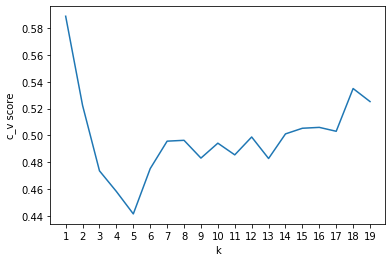

In [20]:
import seaborn as sns
ax = sns.lineplot(x = 'k', y = 'c_v score', data = score_df)
ax.set(xticks=score_df['k'])
ax.set_ylabel('c_v score')
ax.set_xlabel('k')
plt.show()

##### Observation: To find interpretable topics, we chose between k = 5 and k = 6. Unfortunately, using k = 6 led to many words being found in other topics. Hence, we would fall back on k = 5, our next best. We can choose to go to k = 13, however, the increase in topics mwould retain the issues with overlapping words found across topics. 

Recall that the words searched are issues related to mental wellness. 

0: 0.019*"insane" + 0.014*"god" + 0.014*"insecurity" + 0.014*"maybe" + 0.013*"dont" + 0.013*"real" + 0.013*"reason" + 0.012*"struggle" + 0.012*"bitcoin" + 0.011*"forward"

**People expressing the impact of insecurity, the lack of truth, and the bleak bitcoin outlook (implying effects of COVID-19's outbreak from secondary research) to them. In the midst of this, it could be that people are using god as an interjection or a proclamation. **

1: 0.017*"stress" + 0.017*"crazy" + 0.016*"die" + 0.014*"well" + 0.013*"everyone" + 0.012*"take" + 0.012*"going" + 0.011*"could" + 0.010*"‘" + 0.009*"stay"

**People are strongly expressing (sometimes with expletives) how stress has caught up with them, with few references to COVID-19. **

2: 0.046*"meditation" + 0.040*"resilience" + 0.016*"coronavirus" + 0.016*"anxiety" + 0.016*"work" + 0.013*"confusion" + 0.011*"social" + 0.009*"community" + 0.009*"deserve" + 0.009*"free"

**The uncertainty - confusion - which COVID-19 brings on workplaces has triggered anxiety in citizen's lives. Communities are flagged for their social distancing. Fortunately, people are still positively encouraging others such as promoting meditation and resilience.**

3: 0.021*"sad" + 0.016*"love" + 0.012*"struggle" + 0.012*"anger" + 0.011*"life" + 0.011*"feeling" + 0.011*"new" + 0.010*"self" + 0.009*"gratitude" + 0.009*"face"

**Decsriptive tweets about the emotions which one has felt recently, albeit with a strong tie to their relationships. They are mostly negative in sentiment. **

4: 0.053*"psychology" + 0.016*"tired" + 0.014*"covid19" + 0.014*"life" + 0.013*"keep" + 0.013*"video" + 0.011*"peace" + 0.011*"therapy" + 0.010*"personality" + 0.010*"look"

**Compared to the others, this topic highlights the usage of more technical terms at describing themes related to mental wellness. Given they are more positive in sentiment, it suggests that they are intended to help readers cope better.**

5: 0.036*"sanity" + 0.030*"today" + 0.021*"big" + 0.017*"suicide" + 0.016*"way" + 0.015*"thanks" + 0.015*"energy" + 0.015*"heart" + 0.015*"home" + 0.012*"woman"

**Suicide is a real outcome when mental wellness tips past a certain point. In fact, people might be getting sarcastic about their hurts. It appears that home contributes partially to one's mental hurt. **

6: 0.015*"good" + 0.015*"panic" + 0.014*"use" + 0.014*"find" + 0.013*"think" + 0.011*"click" + 0.009*"care" + 0.009*"case" + 0.008*"doe" + 0.008*"china"

**A broad topic on people tweeting about life in China and comparing them with Singapore, whilst also bring up separate issues on school related matters.**





1 - People are strongly expressing (sometimes with expletives) how stress has caught up with them, with occasional references to COVID-19.
2 - Decsriptive tweets about the emotions which one has felt recently, particularly with strong ties to their relationships. They are mostly negative in sentiment.
3 - A broad topic on people tweeting about life in China and comparing them with Singapore, whilst also bring up separate issues on school related matters.
4 - The uncertainty - confusion - which COVID-19 brings on workplaces has triggered anxiety in citizen's lives. Communities are flagged for their social distancing. Fortunately, people are still positively encouraging others such as promoting meditation and resilience.
5 - People expressing the impact of insecurity, the lack of truth, and the bleak bitcoin outlook (implying effects of COVID-19's outbreak from secondary research) to them. In the midst of this, it could be that people are using god as an interjection or a proclamation.
6 - Compared to the others, this topic highlights the usage of more technical terms at describing themes related to mental wellness. Given they are more positive in sentiment, it suggests that they are intended to help readers cope better.
7 - Suicide is a real outcome when mental wellness tips past a certain point. In fact, people might be getting sarcastic about their hurts. It appears that home contributes partially to one's mental hurt.

In [18]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=ldamodel, texts=vect_df_token, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print(coherence_lda)

0.46753246442555646


In [14]:
import pyLDAvis.gensim

In [64]:
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(ldamodel, corpus_vect, dictionary)

TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker. The exit codes of the workers are {SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6), SIGABRT(-6)}

In [16]:
p = pyLDAvis.gensim.prepare(ldamodel, corpus_vect, dictionary)
pyLDAvis.save_html(p, 'index.html')

/Users/bobbycxy/opt/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))
